In [72]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from astropy.table import Table
from astropy.table import vstack as tab_vstack

from lvmdap.dap_tools import list_columns,read_DAP_file,map_plot_DAP,scatter
from matplotlib import use as mpl_use
#mpl_use('Agg')

%matplotlib inline
from matplotlib import rcParams as rc
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mpl_colors

from my_utils import search_col


In [73]:
#DIR_DAP = 'output_atocatl/'
#dap_file = 'dap-rsp108-sn20-00006110.dap.fits.gz'
#dap_file = 'dap-rsp108-sn20-00003735.dap.fits.gz'#dap-rsp108-sn20-00006112.dap.fits.gz'

#DIR_DAP = 'output_sim/'
#dap_file = '00006109_1700_1_1.0.dap.fits.gz'

DIR_DAP = 'output_dap'
#dap_file='Helix_DR19.dap.fits.gz'
dap_file='Helix_DR19_new.dap.fits.gz'

dap_file=f'{DIR_DAP}/{dap_file}'
tab_DAP=read_DAP_file(dap_file,verbose=True)
tab_DAP['ifu'] = tab_DAP['fiberid'] // 325


---- ALL Table Columns -----
-------------------------------
|        PT                   |
-------------------------------
id        dec       fiberid   
ra        mask      exposure  
----------------------------------
|        RSP                      |
----------------------------------
id             alpha          flux_st        Fe_MW          
MIN_CHISQ      e_alpha        redshift_st    e_Fe_MW        
Teff           Av_st          med_flux_st    alpha_MW       
e_Teff         e_Av_st        e_med_flux_st  e_alpha_MW     
Log_g          z_st           Teff_MW        vel_st         
e_Log_g        e_z_st         e_Teff_MW      log_ML         
Fe             disp_st        Log_g_MW       log_Mass       
e_Fe           e_disp_st      e_Log_g_MW                    
----------------------------------
|        PE_ord                   |
----------------------------------
id                 vel_pe_4340.49     e_disp_pe_6300.3   disp_pe_6716.44    
flux_pe_3726.03    e_vel_pe_4340.49 

In [77]:
#
# Correction of erronoeus sky subtraction
#
#
# Lines with enough S/N
#
#tab_sum_flux=Table()
name_cols=[]
w_sum = []
sum_flux=[]
e_sum_flux=[]
good_eline=[]
corr_eline=[]

col_flux=search_col(tab_DAP,'flux_')
print ('------------------------------------\n')
#col_flux_np=[]

for cols in col_flux:
#    print (cols,cols.find('e_'))
#    if ((cols.find('e_')==-1) and (cols.find('pe_')==-1) and (cols.find('st')==-1)  and (cols.find('pek_')==-1) ):
    if ((cols.find('e_flux')==-1) and (cols.find('st')==-1)):
        print('cols:',cols)
        a_cols=cols.split('_') 
        w_now=a_cols[-1]
        e_cols='e_'+cols
        #mask_sky = (tab_DAP['dec']>-20.5) | (tab_DAP['dec']<-21.2)
        mask_sky = (tab_DAP['dec']>-20.57) | (tab_DAP['dec']<-21.0)
        #mask_ring = ((tab_DAP['dec']>(-20.775-0.025)) & (tab_DAP['dec']<-20.775+0.025)) & ((tab_DAP['ra']>(337.450-0.05)) & (tab_DAP['ra']<(337.450+0.05)))
        #mask_cen = ((tab_DAP['dec']>(-20.85-0.025)) & (tab_DAP['dec']<-20.85+0.025)) & ((tab_DAP['ra']>(337.40-0.05)) & (tab_DAP['ra']<(337.40+0.05)))        
        med_sky = np.median(tab_DAP[cols][mask_sky])
        std_sky = np.std(tab_DAP[cols][mask_sky])
        if ((med_sky>1.5*std_sky) and (std_sky<1000)):
            label = '***'
            tab_DAP[f'{cols}']=tab_DAP[cols]-med_sky
            tab_DAP[f'{e_cols}']=tab_DAP[e_cols]+std_sky   
            corr_eline.append(1)
        else:
            corr_eline.append(0)
            label = ''

        if (cols == 'flux_[NII]_5754.59'):
            mask_sky = mask_sky & (tab_DAP['ifu'] == 0)
            med_sky = np.median(tab_DAP[cols][mask_sky])
            tab_DAP[f'{cols}'][tab_DAP['ifu']<2]=tab_DAP[cols][tab_DAP['ifu']<2]-med_sky
        mask_ring = ((tab_DAP['dec']>(-20.775-0.025)) & (tab_DAP['dec']<-20.775+0.025)) & ((tab_DAP['ra']>(337.450-0.05)) & (tab_DAP['ra']<(337.450+0.05)))
        mask_cen = ((tab_DAP['dec']>(-20.85-0.025)) & (tab_DAP['dec']<-20.85+0.025)) & ((tab_DAP['ra']>(337.40-0.05)) & (tab_DAP['ra']<(337.40+0.05)))        
        med_ring = np.median(tab_DAP[cols][mask_ring])
        med_cen = np.median(tab_DAP[cols][mask_cen])
 
        if ((med_ring>1.5*std_sky) or (med_cen>1.5*std_sky)):
            good_eline.append(1)
            
        else:
            good_eline.append(0)
        print(f'Sky median {cols} [{w_now}]: {med_sky} +/- {std_sky}  {label} , GOOD: {good_eline[-1]}')

        name_cols.append(cols)
        w_sum.append(float(w_now))
        sum_flux_now=np.nansum(tab_DAP[cols])
        e_sum_flux_now=np.sqrt(np.nansum((tab_DAP[e_cols]**2)))
        sum_flux.append(sum_flux_now)
        e_sum_flux.append(e_sum_flux_now)
        #print(cols,w_now)

name_cols=np.array(name_cols)
sum_flux=np.array(sum_flux)
e_sum_flux=np.array(e_sum_flux)
good_eline=np.array(good_eline)
tab_sum_flux_good=Table((name_cols,w_sum,sum_flux,e_sum_flux,good_eline,corr_eline),names=('eline','wave','flux','e_flux','good','corr_sky'))



flux_st
med_flux_st
e_med_flux_st
flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3734.37
flux_HI_3750.15
flux_[FeVII]_3758.9
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_CaII_3933.66
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_[SII]_4068.6
flux_[SII]_4076.35
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_[FeII]_4177.21
flux_[FeV]_4227.2
flux_[FeII]_4243.98
flux_CII_4267.0
flux_[FeII]_4287.4
flux_Hgamma_4340.49
flux_[FeII]_4358.1
flux_[FeII]_4358.37
flux_[FeII]_4359.34
flux_[OIII]_4363.21
flux_[FeII]_4413.78
flux_[FeII]_4414.45
flux_[FeII]_4416.27
flux_[FeII]_4452.11
flux_[FeII]_4457.95
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_[NiII]_4485.21
flux_[MgI]_4562.48
flux_MgI]_4571.1
flux_[FeII]_4632.27
flux_[FeIII]_4658.1
flux_HeII_4685.68
flux_[FeIII]_4701.62
flux_[A

In [78]:
#col_flux=search_col(tab_DAP,'_cor')
corrected = tab_sum_flux_good['eline'][tab_sum_flux_good['corr_sky']==1]
print(corrected)


       eline       
-------------------
  flux_[OI]_5577.34
   flux_[OI]_6300.3
  flux_[OI]_6363.78
flux_Halpha_6562.85
    flux_HI_8665.02
     flux_pe_6300.3
    flux_pe_6562.85
    flux_pek_6300.3
   flux_pek_6562.85


In [79]:
#print(col_flux)

In [80]:
#tab_DAP.add_column(dap_file,name='dap_file')
#tab_DAP['exposure','fiberid','dap_file']

#
# Sky subtraction has a clear issue in the Helix data.
#

#junk = search_col(tab_DAP,'flux_')



In [81]:
def map_plot_DAP_rgb(tab_DAP,\
                     rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                     rgb_scale=(1.0,1.0,1.0),\
                 vmin=0, vmax=0, titles=('r','g','b'), filename='junk',\
                fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,fs=18):

    rc.update({'font.size': fs*fsize/5,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : fs*fsize/5,\
               'ytick.labelsize' : fs*fsize/5,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X= tab_DAP['ra'].value
    Y= tab_DAP['dec'].value
    R=tab_DAP[rgb_key[2]].value  
    G=tab_DAP[rgb_key[1]].value    
    B=tab_DAP[rgb_key[0]].value 
    R = R * rgb_scale[0]
    G = G * rgb_scale[1]
    B = B * rgb_scale[2]
    RGB = np.stack((R, G, B), axis=1)
    if (vmin==vmax):
        vmin=np.nanmin(RGB)
        vmax=np.nanmax(RGB)
    print(f'min/max:{vmin}/{vmax}')
    r = (R-vmin)/(vmax-vmin)
    g = (G-vmin)/(vmax-vmin)
    b = (B-vmin)/(vmax-vmin)

    r[r>1]=1
    r[r<0]=0
    b[b>1]=1
    b[b<0]=0
    r[r>1]=1
    r[r<0]=0    
    
    r = np.ma.filled(r, fill_value=0.0)
    g = np.ma.filled(g, fill_value=0.0)
    b = np.ma.filled(b, fill_value=0.0)

    r=r**gamma
    g=g**gamma
    b=b**gamma
    
#    print (r)
    r = np.ma.compressed(r)
    g = np.ma.compressed(g)
    b = np.ma.compressed(b)   


    #print(r,g,b)
    colors = np.stack((r, g, b), axis=1)
    colors[colors>1]=1
    colors[colors<0]=0
#    print(colors)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize*0.95))
#    norm=mpl_colors.PowerNorm(vmin=0,vmax=1,gamma=gamma)
    scatter(X, Y, ax, color=colors, size=sf*35.6/3600)#, color=colors)
    ax.set_xlabel('Ra [deg]')#,fontsize=21)
    ax.set_ylabel('Dec [deg]')#,fontsize=21)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.06*(yy[1]-yy[0]),titles[0],fontsize=fs*(fsize/5),color='tomato')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.12*(yy[1]-yy[0]),titles[1],fontsize=fs*(fsize/5),color='forestgreen')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.18*(yy[1]-yy[0]),titles[2],fontsize=fs*(fsize/5),color='steelblue')

    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}', facecolor='white')
    plt.close()
    return colors

def search_col(tab,key):
    a_keys=[]
    for keys in tab.columns:
        if (keys.find(key)>-1):
            print(keys)
            a_keys.append(keys)
    return a_keys

In [82]:
search_col(tab_DAP,'[OII]')

flux_[OII]_3726.03
flux_[OII]_3728.82
vel_[OII]_3726.03
vel_[OII]_3728.82
disp_[OII]_3726.03
disp_[OII]_3728.82
EW_[OII]_3726.03
EW_[OII]_3728.82
e_flux_[OII]_3726.03
e_flux_[OII]_3728.82
e_vel_[OII]_3726.03
e_vel_[OII]_3728.82
e_disp_[OII]_3726.03
e_disp_[OII]_3728.82
e_EW_[OII]_3726.03
e_EW_[OII]_3728.82
flux_[OII]_7318.92
flux_[OII]_7329.66
vel_[OII]_7318.92
vel_[OII]_7329.66
disp_[OII]_7318.92
disp_[OII]_7329.66
EW_[OII]_7318.92
EW_[OII]_7329.66
e_flux_[OII]_7318.92
e_flux_[OII]_7329.66
e_vel_[OII]_7318.92
e_vel_[OII]_7329.66
e_disp_[OII]_7318.92
e_disp_[OII]_7329.66
e_EW_[OII]_7318.92
e_EW_[OII]_7329.66
sigma_kms_[OII]_3726.03
sigma_kms_[OII]_3728.82
sigma_kms_[OII]_7318.92
sigma_kms_[OII]_7329.66
X_sq_[OII]_3726.03
X_sq_[OII]_3728.82
X_sq_[OII]_7318.92
X_sq_[OII]_7329.66


['flux_[OII]_3726.03',
 'flux_[OII]_3728.82',
 'vel_[OII]_3726.03',
 'vel_[OII]_3728.82',
 'disp_[OII]_3726.03',
 'disp_[OII]_3728.82',
 'EW_[OII]_3726.03',
 'EW_[OII]_3728.82',
 'e_flux_[OII]_3726.03',
 'e_flux_[OII]_3728.82',
 'e_vel_[OII]_3726.03',
 'e_vel_[OII]_3728.82',
 'e_disp_[OII]_3726.03',
 'e_disp_[OII]_3728.82',
 'e_EW_[OII]_3726.03',
 'e_EW_[OII]_3728.82',
 'flux_[OII]_7318.92',
 'flux_[OII]_7329.66',
 'vel_[OII]_7318.92',
 'vel_[OII]_7329.66',
 'disp_[OII]_7318.92',
 'disp_[OII]_7329.66',
 'EW_[OII]_7318.92',
 'EW_[OII]_7329.66',
 'e_flux_[OII]_7318.92',
 'e_flux_[OII]_7329.66',
 'e_vel_[OII]_7318.92',
 'e_vel_[OII]_7329.66',
 'e_disp_[OII]_7318.92',
 'e_disp_[OII]_7329.66',
 'e_EW_[OII]_7318.92',
 'e_EW_[OII]_7329.66',
 'sigma_kms_[OII]_3726.03',
 'sigma_kms_[OII]_3728.82',
 'sigma_kms_[OII]_7318.92',
 'sigma_kms_[OII]_7329.66',
 'X_sq_[OII]_3726.03',
 'X_sq_[OII]_3728.82',
 'X_sq_[OII]_7318.92',
 'X_sq_[OII]_7329.66']

min/max:-1000/50000.0


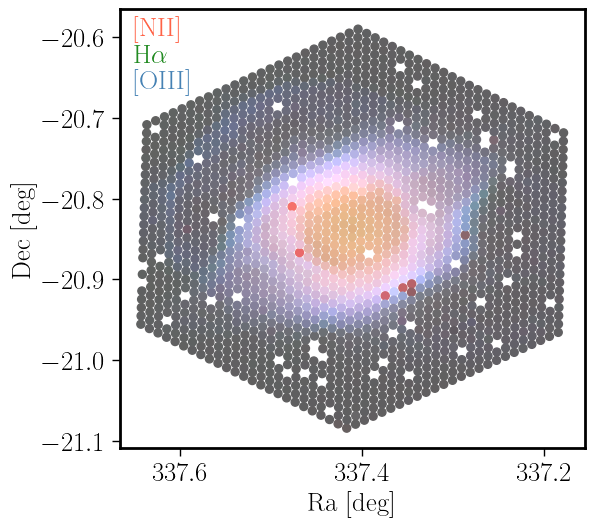

In [83]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

min/max:-1000/50000.0


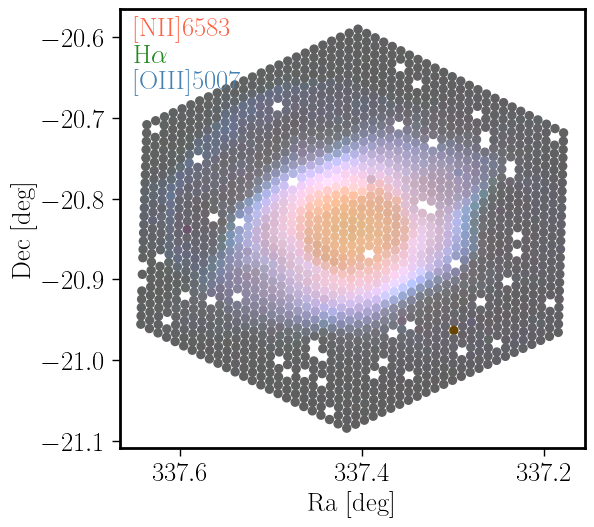

In [84]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_6583.45','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]6583',r'H$\alpha$','[OIII]5007'), filename='Helix_PN',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

In [85]:
junk = search_col(tab_DAP,'flux_H')

flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_HI_3734.37
flux_HI_3750.15
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_HeI_3888.65
flux_HI_3889.05
flux_HeI_3964.73
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_Hgamma_4340.49
flux_HeI_4471.48
flux_HeII_4685.68
flux_HeI_4713.14
flux_Hbeta_4861.36
flux_HeI_4921.93
flux_HeI_5015.68
flux_HeII_5411.52
e_flux_HI_3686.83
e_flux_HI_3691.56
e_flux_HI_3697.15
e_flux_HI_3703.85
e_flux_HI_3711.97
e_flux_HI_3734.37
e_flux_HI_3750.15
e_flux_HI_3770.63
e_flux_HI_3797.9
e_flux_HeI_3819.61
e_flux_HI_3835.38
e_flux_HeI_3888.65
e_flux_HI_3889.05
e_flux_HeI_3964.73
e_flux_Hepsilon_3970.07
e_flux_HeI_4026.19
e_flux_Hdelta_4101.77
e_flux_HeI_4120.81
e_flux_Hgamma_4340.49
e_flux_HeI_4471.48
e_flux_HeII_4685.68
e_flux_HeI_4713.14
e_flux_Hbeta_4861.36
e_flux_HeI_4921.93
e_flux_HeI_5015.68
e_flux_HeII_5411.52
flux_HeI_5876.0
flux_Halpha_6562.85
flux_HeI_6678.15
flux_

min/max:-10/500.0


/tmp/ipykernel_160355/2202648745.py:61: RuntimeWarning: invalid value encountered in power
  g=g**gamma


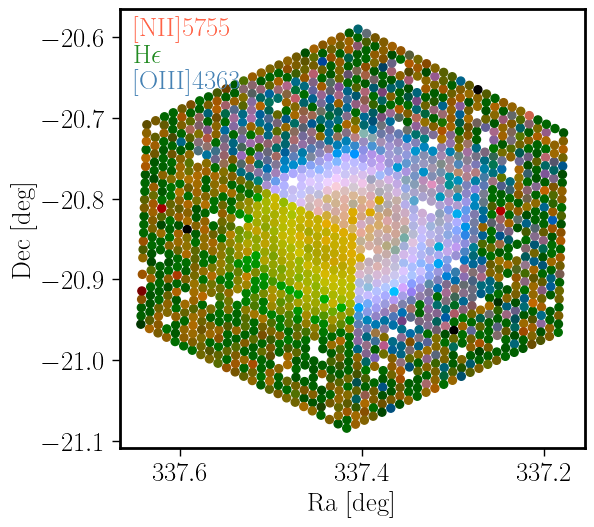

In [86]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_5754.59','flux_Hepsilon_3970.07','flux_[OIII]_4363.21'), \
                 rgb_scale = (1,0.1,1), \
                 vmin=-10, vmax=500.0,\
                 titles=('[NII]5755',r'H$\epsilon$','[OIII]4363'), filename='Helix_PN_faint',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

min/max:-1000/50000.0


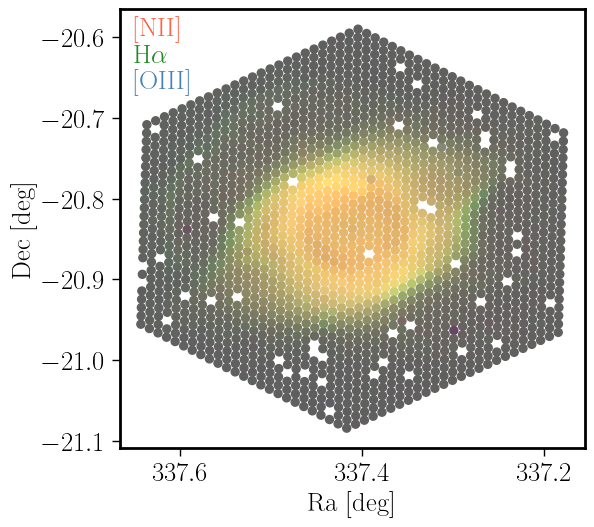

In [87]:
colors_t=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[SIII]_9531.1','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix_SIII',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

In [88]:
search_col(tab_DAP,'_373')

flux_HI_3734.37
vel_HI_3734.37
disp_HI_3734.37
EW_HI_3734.37
e_flux_HI_3734.37
e_vel_HI_3734.37
e_disp_HI_3734.37
e_EW_HI_3734.37
sigma_kms_HI_3734.37
X_sq_HI_3734.37


['flux_HI_3734.37',
 'vel_HI_3734.37',
 'disp_HI_3734.37',
 'EW_HI_3734.37',
 'e_flux_HI_3734.37',
 'e_vel_HI_3734.37',
 'e_disp_HI_3734.37',
 'e_EW_HI_3734.37',
 'sigma_kms_HI_3734.37',
 'X_sq_HI_3734.37']

In [89]:
search_col(tab_DAP,'flux_')

flux_st
med_flux_st
e_med_flux_st
flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3734.37
flux_HI_3750.15
flux_[FeVII]_3758.9
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_CaII_3933.66
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_[SII]_4068.6
flux_[SII]_4076.35
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_[FeII]_4177.21
flux_[FeV]_4227.2
flux_[FeII]_4243.98
flux_CII_4267.0
flux_[FeII]_4287.4
flux_Hgamma_4340.49
flux_[FeII]_4358.1
flux_[FeII]_4358.37
flux_[FeII]_4359.34
flux_[OIII]_4363.21
flux_[FeII]_4413.78
flux_[FeII]_4414.45
flux_[FeII]_4416.27
flux_[FeII]_4452.11
flux_[FeII]_4457.95
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_[NiII]_4485.21
flux_[MgI]_4562.48
flux_MgI]_4571.1
flux_[FeII]_4632.27
flux_[FeIII]_4658.1
flux_HeII_4685.68
flux_[FeIII]_4701.62
flux_[A

['flux_st',
 'med_flux_st',
 'e_med_flux_st',
 'flux_HI_3686.83',
 'flux_HI_3691.56',
 'flux_HI_3697.15',
 'flux_HI_3703.85',
 'flux_HI_3711.97',
 'flux_[OII]_3726.03',
 'flux_[OII]_3728.82',
 'flux_HI_3734.37',
 'flux_HI_3750.15',
 'flux_[FeVII]_3758.9',
 'flux_HI_3770.63',
 'flux_HI_3797.9',
 'flux_HeI_3819.61',
 'flux_HI_3835.38',
 'flux_[NeIII]_3868.75',
 'flux_HeI_3888.65',
 'flux_HI_3889.05',
 'flux_CaII_3933.66',
 'flux_HeI_3964.73',
 'flux_[NeIII]_3967.46',
 'flux_CaII_3968.47',
 'flux_Hepsilon_3970.07',
 'flux_HeI_4026.19',
 'flux_[SII]_4068.6',
 'flux_[SII]_4076.35',
 'flux_Hdelta_4101.77',
 'flux_HeI_4120.81',
 'flux_[FeII]_4177.21',
 'flux_[FeV]_4227.2',
 'flux_[FeII]_4243.98',
 'flux_CII_4267.0',
 'flux_[FeII]_4287.4',
 'flux_Hgamma_4340.49',
 'flux_[FeII]_4358.1',
 'flux_[FeII]_4358.37',
 'flux_[FeII]_4359.34',
 'flux_[OIII]_4363.21',
 'flux_[FeII]_4413.78',
 'flux_[FeII]_4414.45',
 'flux_[FeII]_4416.27',
 'flux_[FeII]_4452.11',
 'flux_[FeII]_4457.95',
 'flux_[FeII]_4470.

/tmp/ipykernel_160355/2569418945.py:56: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)
/tmp/ipykernel_160355/2569418945.py:57: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)
/tmp/ipykernel_160355/2569418945.py:58: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)
/tmp/ipykernel_160355/2569418945.py:59: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)
/tmp/ipykernel_160355/2569418945.py:60: RuntimeWarning: invalid value encountered in log10
  O2=np.log10(OII)-np.log10(Hb)
/tmp/ipykernel_160355/2569418945.py:61: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
/tmp/ipykernel_160355/2569418945.py:62: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
/tmp/ipykernel_160355/2569418945.py:84: MatplotlibDeprecationWarning: The get

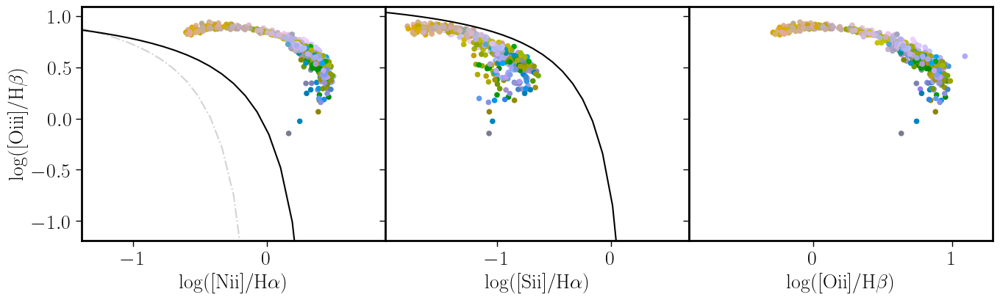

In [90]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
OII=tab_DAP['flux_[OII]_3726.03']+tab_DAP['flux_[OII]_3728.82']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
eOII=np.sqrt(tab_DAP['e_flux_[OII]_3726.03']**2+tab_DAP['e_flux_[OII]_3728.82']**2)
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
O2=np.log10(OII)-np.log10(Hb)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OII=0.73/((x-0.3))+1.33;#+1.10;
cut_y_OII_AGNs=1.18*(x)+0.36;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<0],cut_y3[x<0],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.5],cut_y4[x<0.5],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
#axes[0,2].plot(x[x<0.6],cut_y_OII[x<0.6],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oii]/H$\beta$)')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min1-0.6,x_max1-0.2)
axes[0,2].set_xlim(x_min1+0.5,x_max1+0.4)
axes[0,0].set_ylim(y_min1+0.1,y_max1+0.1)





plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_ORION.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

/tmp/ipykernel_160355/1270791239.py:54: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)
/tmp/ipykernel_160355/1270791239.py:55: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)
/tmp/ipykernel_160355/1270791239.py:56: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)
/tmp/ipykernel_160355/1270791239.py:57: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)
/tmp/ipykernel_160355/1270791239.py:58: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
/tmp/ipykernel_160355/1270791239.py:59: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])


/tmp/ipykernel_160355/1270791239.py:81: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('viridis')


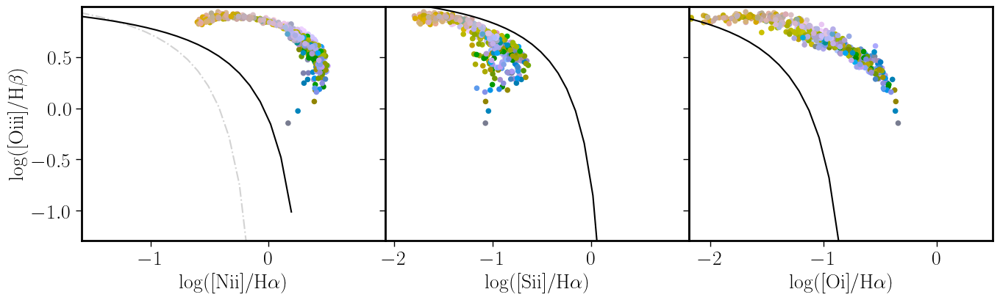

In [91]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<-0.1],cut_y3[x<-0.1],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.2],cut_y4[x<0.2],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
axes[0,0].set_xlim(x_min1-0.2,x_max1+0.1)
axes[0,1].set_xlim(x_min1-0.7,x_max1+0.1)
axes[0,2].set_xlim(x_min1-0.8,x_max1-0.4)
axes[0,0].set_ylim(y_min1,y_max1)





plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_HELIX_OI.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

In [92]:
#
# Lines with enough S/N
#
#tab_sum_flux=Table()
name_cols=[]
w_sum = []
sum_flux=[]
e_sum_flux=[]


col_flux=search_col(tab_DAP,'flux_')
print ('------------------------------------\n')
#col_flux_np=[]
for cols in col_flux:
#    print (cols,cols.find('e_'))
    if ((cols.find('e_')==-1) and (cols.find('pe_')==-1) and (cols.find('st')==-1)  and (cols.find('pek_')==-1) ):
        a_cols=cols.split('_') 
        w_now=a_cols[-1]
        e_cols='e_'+cols
        name_cols.append(cols)
        w_sum.append(float(w_now))
        sum_flux_now=np.nansum(tab_DAP[cols])
        e_sum_flux_now=np.sqrt(np.nansum((tab_DAP[e_cols]**2)))
        sum_flux.append(sum_flux_now)
        e_sum_flux.append(e_sum_flux_now)

name_cols=np.array(name_cols)
sum_flux=np.array(sum_flux)
e_sum_flux=np.array(e_sum_flux)
tab_sum_flux=Table((name_cols,w_sum,sum_flux,e_sum_flux),names=('eline','wave','flux','e_flux'))


flux_st
med_flux_st
e_med_flux_st
flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3734.37
flux_HI_3750.15
flux_[FeVII]_3758.9
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_CaII_3933.66
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_[SII]_4068.6
flux_[SII]_4076.35
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_[FeII]_4177.21
flux_[FeV]_4227.2
flux_[FeII]_4243.98
flux_CII_4267.0
flux_[FeII]_4287.4
flux_Hgamma_4340.49
flux_[FeII]_4358.1
flux_[FeII]_4358.37
flux_[FeII]_4359.34
flux_[OIII]_4363.21
flux_[FeII]_4413.78
flux_[FeII]_4414.45
flux_[FeII]_4416.27
flux_[FeII]_4452.11
flux_[FeII]_4457.95
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_[NiII]_4485.21
flux_[MgI]_4562.48
flux_MgI]_4571.1
flux_[FeII]_4632.27
flux_[FeIII]_4658.1
flux_HeII_4685.68
flux_[FeIII]_4701.62
flux_[A

27


eline,wave,flux,e_flux,SN
str21,float64,float64,float64,float64
flux_[OIII]_5006.84,5006.84,11820861.554101793,25515.027368504172,463.29017732873376
flux_[NII]_6583.45,6583.45,11206813.814891055,22758.847840422757,492.4156922823771
flux_Halpha_6562.85,6562.85,6477943.881882706,4029.550021850205,1607.609744700054
flux_[OII]_3728.82,3728.82,6142612.791323947,4434.13415556236,1385.3015212943885
flux_[OII]_3726.03,3726.03,4693410.237035557,4692.826059563782,1000.1244830863876
flux_[NII]_6548.05,6548.05,3717622.759880605,68757.55608650645,54.068570372154085
flux_[OIII]_4958.91,4958.91,3690279.0351406634,83849.22648298778,44.01088942531135
flux_Hbeta_4861.36,4861.36,2382048.08234713,7815.446600950078,304.78719950022537
flux_[NeIII]_3868.75,3868.75,2100798.04549238,6034.0402082151095,348.1577803595385


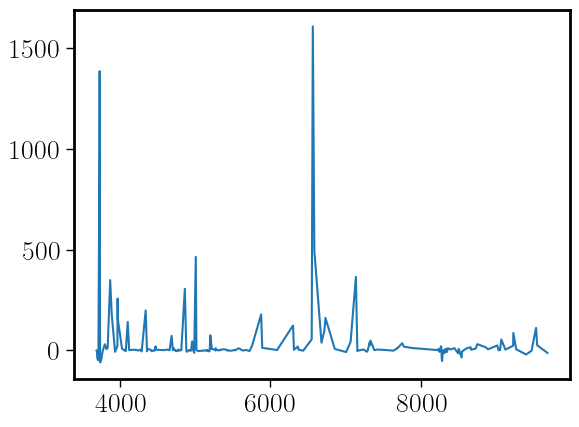

In [93]:
#tab_sum_flux
SN = tab_sum_flux['flux']/tab_sum_flux['e_flux']
try:
    tab_sum_flux.add_column(SN,name='SN')
except:
    print('SN not needed')
plt.plot(tab_sum_flux['wave'],SN)
tab_sum_good = tab_sum_flux[SN>45]
print(len(tab_sum_good))

tab_sum_flux.sort('flux',reverse=True)

#search_col(tab_DAP,'Halpha')
#SN_Ha=SN[tab_sum_flux['wave']==6562.85]

tab_sum_flux[0:36]

In [94]:
def map_plot_DAP(tab_DAP,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None):

    rc.update({'font.size': 19,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19,\
               'ytick.labelsize' : 19,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)
    print(line,vmin,vmax)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize/1.3))
    norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
    scat=scatter(X, Y, ax, size=sf*35.6/3600, c=C, cmap=cmap, norm=norm)
#    scat=scatter(X, Y, ax, size=35.6/3600, c=C,vmin = vmin, vmax = vmax, cmap=cmap, norm=colors.PowerNorm(gamma=gamma))
    ax.set_xlabel('Ra [deg]')#,fontsize=21)
    ax.set_ylabel('Dec [deg]')#,fontsize=21)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*(yy[1]-yy[0]),title,color='black',\
            bbox=props)
    ax.text(xx[1]-0.52*(xx[1]-xx[0]),yy[0]+0.06*(yy[1]-yy[0]),r'10$^{-16}$ erg/s/cm$^2$',color='black',\
            bbox=props)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(scat.sc, cax=cax, format='%.0e')#,label=fr'{title}')#,fontsize=21)
    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}')
    plt.close()


In [95]:
def map_plot_DAP_ax(tab_DAP,ax=None,fig=None,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,xlab=True,ylab=True, fs=1.0,f_scale=1e7):

    rc.update({'font.size': 19*fs,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19*fs,\
               'ytick.labelsize' : 19*fs,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6*fs,\
               'ytick.major.size'        :   6*fs,\
               'xtick.minor.size'        :   3*fs,\
               'ytick.minor.size'        :   3*fs,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]/f_scale    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)
#    print(line,vmin,vmax)
    #fig,ax = plt.subplots(1,1,figsize=(fsize,fsize/1.3))
#    print(f'vmin/vmax:{vmin}/{vmax}')
    if (gamma>0):
        norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
        size_sc = sf*35.6/3600
        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, norm=norm, rasterized=True)
    else:
#        print('PASO')
        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, vmin=vmin, vmax=vmax, rasterized=True)
#    scat=scatter(X, Y, ax=ax, size=sf*35.6/3600, c=C, cmap=cmap, norm=norm, rasterized=True)
#    scat=scatter(X, Y, ax, size=35.6/3600, c=C,vmin = vmin, vmax = vmax, cmap=cmap, norm=colors.PowerNorm(gamma=gamma))
    if (xlab == True):
        ax.set_xlabel('Ra [deg]',fontsize=19*fs)
    if (ylab == True):
        ax.set_ylabel('Dec [deg]',fontsize=19*fs)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*fs*(yy[1]-yy[0]),rf'{title}',color='black',\
            bbox=props)
#    ax.text(xx[1]-0.52*(xx[1]-xx[0]),yy[0]+0.06*(yy[1]-yy[0]),r'10$^{-16}$ erg/s/cm$^2$',color='black',\
#            bbox=props)
    return scat
    #divider = make_axes_locatable(ax)
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    #plt.colorbar(scat, cax=cax, format='%.0e')#,label=fr'{title}')#,fontsize=21)
    #if (tab_pt != None):
    #    for tap_pt_now in tab_pt:
    #        ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
#    try:
#        plt.show()
#    except:
#        plt_show=False
#    fig.tight_layout()
#    fig.savefig(f'{figs_dir}/{filename}.{fig_type}')
#    plt.close()


In [96]:
search_col(tab_DAP,'6562.85')

flux_Halpha_6562.85
vel_Halpha_6562.85
disp_Halpha_6562.85
EW_Halpha_6562.85
e_flux_Halpha_6562.85
e_vel_Halpha_6562.85
e_disp_Halpha_6562.85
e_EW_Halpha_6562.85
flux_pe_6562.85
e_flux_pe_6562.85
disp_pe_6562.85
e_disp_pe_6562.85
vel_pe_6562.85
e_vel_pe_6562.85
flux_pek_6562.85
e_flux_pek_6562.85
disp_pek_6562.85
e_disp_pek_6562.85
vel_pek_6562.85
e_vel_pek_6562.85
sigma_kms_Halpha_6562.85
sigma_kms_pe_6562.85
sigma_kms_pek_6562.85
X_sq_Halpha_6562.85
X_sq_pe_6562.85
X_sq_pek_6562.85


['flux_Halpha_6562.85',
 'vel_Halpha_6562.85',
 'disp_Halpha_6562.85',
 'EW_Halpha_6562.85',
 'e_flux_Halpha_6562.85',
 'e_vel_Halpha_6562.85',
 'e_disp_Halpha_6562.85',
 'e_EW_Halpha_6562.85',
 'flux_pe_6562.85',
 'e_flux_pe_6562.85',
 'disp_pe_6562.85',
 'e_disp_pe_6562.85',
 'vel_pe_6562.85',
 'e_vel_pe_6562.85',
 'flux_pek_6562.85',
 'e_flux_pek_6562.85',
 'disp_pek_6562.85',
 'e_disp_pek_6562.85',
 'vel_pek_6562.85',
 'e_vel_pek_6562.85',
 'sigma_kms_Halpha_6562.85',
 'sigma_kms_pe_6562.85',
 'sigma_kms_pek_6562.85',
 'X_sq_Halpha_6562.85',
 'X_sq_pe_6562.85',
 'X_sq_pek_6562.85']

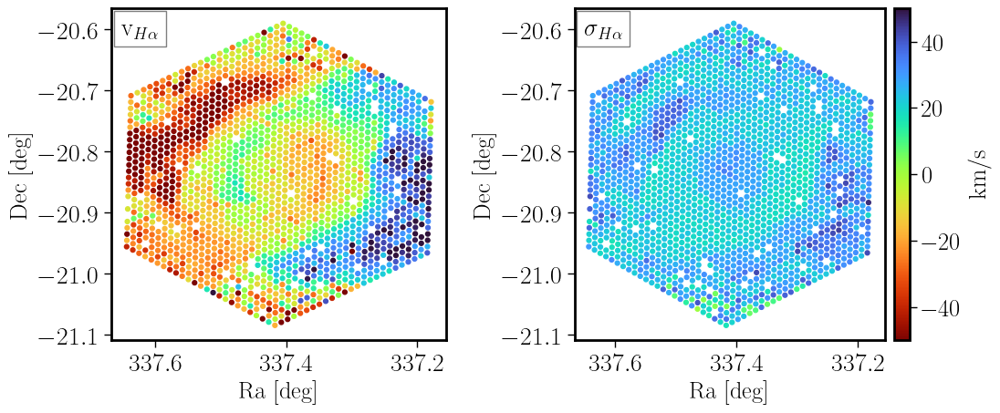

In [97]:
fig, axes = plt.subplots(1,2,figsize=(10.5,5))
#cmap_now = 'Spectral_r'
cmap_now = 'turbo_r'
#np.zeros(len(tab_DAP),dtype=int)
filename='Helix_DR19_kin'
xlab = True
ylab = True
ax = axes[0]

scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_pek_6562.85', \
                 vmin=-50, vmax=10, title=r'v$_{H\alpha}$', filename=filename,\
             cmap=cmap_now, fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)
ax = axes[1]
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='sigma_kms_pek_6562.85', \
                 vmin=-50, vmax=50, title=r'$\sigma_{H\alpha}$', filename=filename,\
             cmap=cmap_now, fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

plt.tight_layout()

fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/kin.pdf', facecolor='white')


(array([  1.,   1.,   0.,   0.,   1.,   0.,   1.,   0.,   1.,   0.,   3.,
          1.,   0.,   1.,   2.,   1.,   2.,   1.,   1.,   2.,   1.,   1.,
          0.,   0.,   1.,   1.,   0.,   1.,   1.,   1.,   3.,   0.,   2.,
          2.,   2.,   9.,  11.,  13.,  34.,  36.,  43.,  60.,  54.,  70.,
         60.,  71.,  59.,  64.,  79.,  70.,  53.,  46.,  34.,  26.,  23.,
         25.,  20.,  30.,  42.,  85., 177.,  35.,  22.,  21.,  22.,  26.,
         16.,  33.,  22.,  21.,  22.,  15.,  12.,  11.,  13.,  12.,  13.,
          7.,  12.,  13.,   8.,   8.,   8.,  14.,  11.,   5.,   4.,   3.,
          3.,   1.,   4.,   5.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,
          1.]),
 array([ 0.99696827,  1.44973719,  1.90250611,  2.35527515,  2.80804396,
         3.260813  ,  3.7135818 ,  4.16635084,  4.61911964,  5.07188845,
         5.52465773,  5.97742653,  6.43019533,  6.88296413,  7.33573341,
         7.78850222,  8.24127102,  8.6940403 ,  9.14680862,  9.5995779 ,
        10.05234718, 10.50

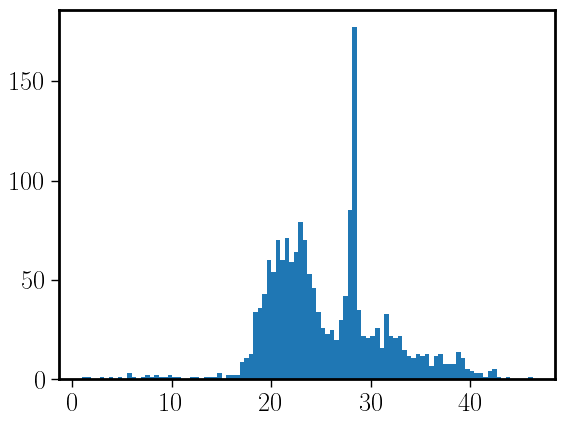

In [98]:
plt.hist(tab_DAP['sigma_kms_pek_6562.85'],bins=100)

Sky median [OIII]5006.84: 424.71312767617485 +/- 12780.630764799631  
Sky median [NII]6583.45: 944.6323302751431 +/- 11038.653925460683  
Sky median H$\alpha$6562.85: 449.19385467048704 +/- 5944.265309398605  
Sky median [OII]3728.82: 650.6946237135512 +/- 5865.627858087252  
Sky median [OII]3726.03: 509.7964950034531 +/- 4518.79884376004  
Sky median [NII]6548.05: 300.26968429494013 +/- 3677.056625654269  
Sky median [OIII]4958.91: 114.38541633566895 +/- 4016.8210824242997  
Sky median H$\beta$4861.36: 197.93435943407053 +/- 2150.6640723938626  
Sky median [NeIII]3868.75: 152.38193139501092 +/- 1959.748733020385  
Sky median H$\gamma$4340.49: 100.8352404263661 +/- 968.7986477202644  
Sky median [OI]6300.3: 214.412435743856 +/- 716.4443741177543  
Sky median [NeIII]3967.46: 64.9795722796853 +/- 702.0681650573769  
Sky median H$\delta$4101.77: 83.01151763521497 +/- 578.930387468431  
Sky median HeI3888.65: 79.00244854326485 +/- 562.7713208722612  
Sky median CaII3968.47: 52.368697728815

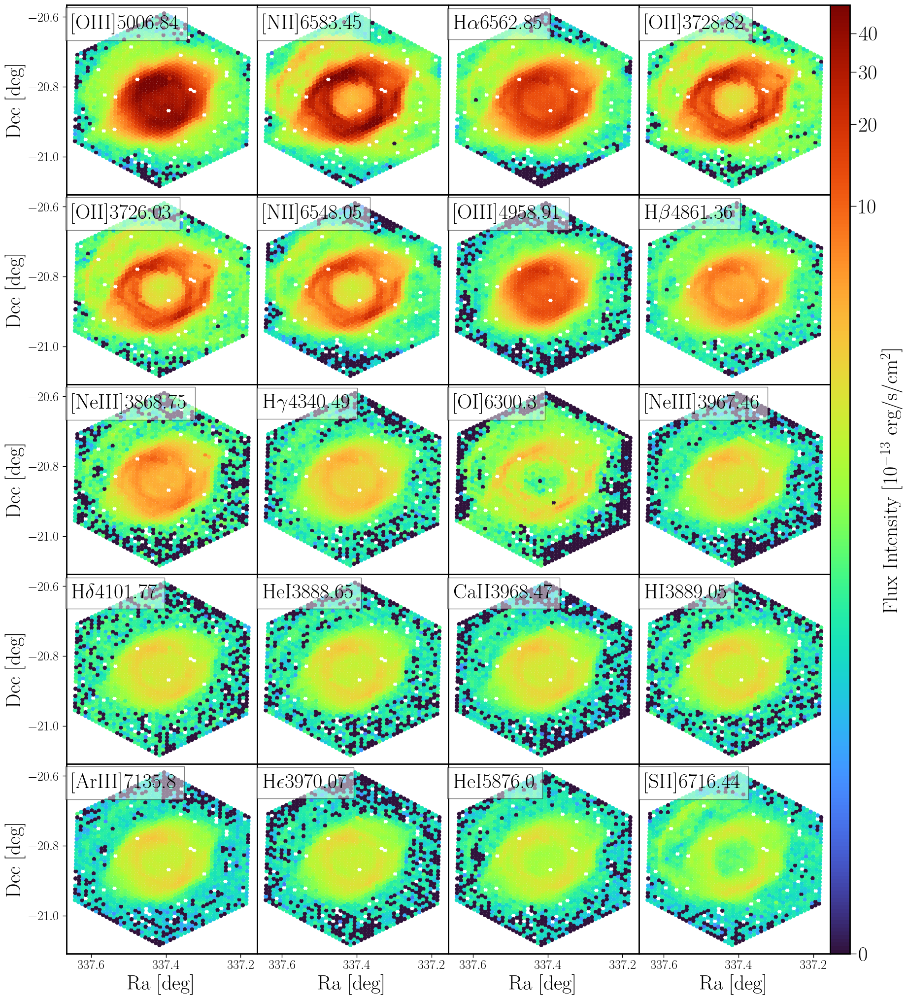

In [99]:
#cmap='gnuplot2_r'
gamma=0.15
#cmap='pink_r'
#cmap='Spectral'
#cmap='nipy_spectral_r'
#cmap='cubehelix_r'
#cmap='terrain_r'
#cmap = 'turbo_r'
cmap = 'turbo'
#cmap='gist_earth_r'
#fig = plt.figure()
NX=4
NY=5
fs=1.6
#f_scale=1e7
f_scale=1e3
fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


#axs_flat = axs.flatten
for I,ax in enumerate(np.ravel(axs)):
    #print(ax)
    tab_now=tab_sum_flux[I]
    eline=tab_now['eline']
    wave=np.ceil(tab_now['wave'])
    II=str(I)
    if (I<10):
        II='0'+str(I)
    filename=f'Helix_{II}_{wave}'
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    xlab = False
    ylab = False
    if ((I/NX)==int(I/NX)):
        ylab=True
    else:
        ax.set_yticks([])
    if (I>=(NX*NY-4)):
        xlab=True
    else:
        ax.set_xticks([])
    vmin=0
    vmax=0.49e5
#    vmax=8e5
    mask_sky = (tab_DAP['dec']<-20.5) | (tab_DAP['dec']>-21.2)

    med_sky = np.median(tab_DAP[eline][mask_sky])
    std_sky = np.std(tab_DAP[eline][mask_sky])
    if (med_sky>2*std_sky):
        label = '***'
    else:
        label = ''
    print(f'Sky median {title}: {med_sky} +/- {std_sky}  {label}')

    scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                 vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    #print(xx,yy)
    
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)    
cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')

plt.subplots_adjust(wspace=0,hspace=0)
plt.show()    
#fig.tight_layout(w_pad=0.2)
fig.savefig(f'figs/Helix_felines.pdf', facecolor='white')

#if (I>3):
    #    break

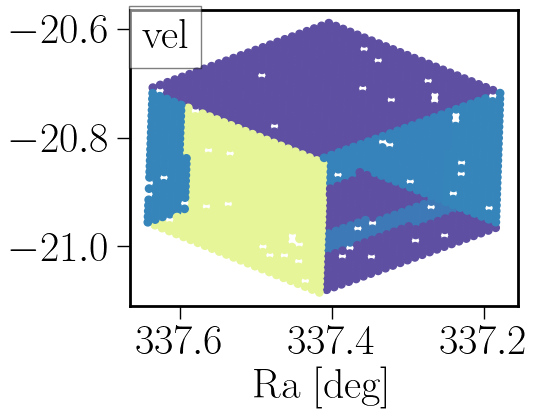

In [100]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_st', \
                 vmin=-100, vmax=0, title='vel', filename=filename,\
             cmap='Spectral', fsize=6.5, figs_dir='figs',gamma=1.0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=1.0)

In [101]:
tab_DAP['vel_st']

-40.044693266116205
-40.044693266116205
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341
9.07458081694341


In [102]:
print(np.unique(tab_DAP['ifu']))
nn = 1800 / 6
print(nn)

ifu
---
  0
  1
  2
  3
  4
  5
300.0


In [103]:
tab_DAP['id','fiberid','mask','ifu']

id,fiberid,mask,ifu
str9,int64,bool,int64
4297.10,10,True,0
4297.100,100,True,0
4297.1000,1000,True,3
4297.1001,1001,True,3
4297.1002,1002,True,3
4297.1003,1003,True,3
4297.1004,1004,True,3
4297.1005,1005,True,3
4297.1006,1006,True,3


In [104]:
#plt.show()

elines_pek = tab_sum_flux_good['eline'][[entry.find('_pek_') > -1 for entry in tab_sum_flux_good['eline']]]
elines_pe = tab_sum_flux_good['eline'][[entry.find('_pe_') > -1 for entry in tab_sum_flux_good['eline']]]
mask_pek = [entry in elines_pek for entry in tab_sum_flux_good['eline']]
mask_pe = [entry in elines_pe for entry in tab_sum_flux_good['eline']]
mask_np = ~ (np.array(mask_pek) | np.array(mask_pe))

tab_sum_flux_good[mask_pe]


eline,wave,flux,e_flux,good,corr_sky
str21,float64,float64,float64,int64,int64
flux_pe_3726.03,3726.03,4752428.2857,7697.45324612922,1,0
flux_pe_3728.82,3728.82,6631954.6456,9141.600929882768,1,0
flux_pe_4101.77,4101.77,664663.7971,2480.274749522097,1,0
flux_pe_4340.49,4340.49,1073273.9246999999,2398.89968184065,1,0
flux_pe_4861.36,4861.36,2310542.2932,4632.78012943617,1,0
flux_pe_4958.91,4958.91,3916230.5560000003,5457.862783807752,1,0
flux_pe_5006.84,5006.84,11760452.1228,12804.675264219235,1,0
flux_pe_6300.3,6300.3,828659.6368999998,10101.436001507083,1,1
flux_pe_6548.05,6548.05,3655074.7645,7781.170430615384,1,0


# NP good lines:  60


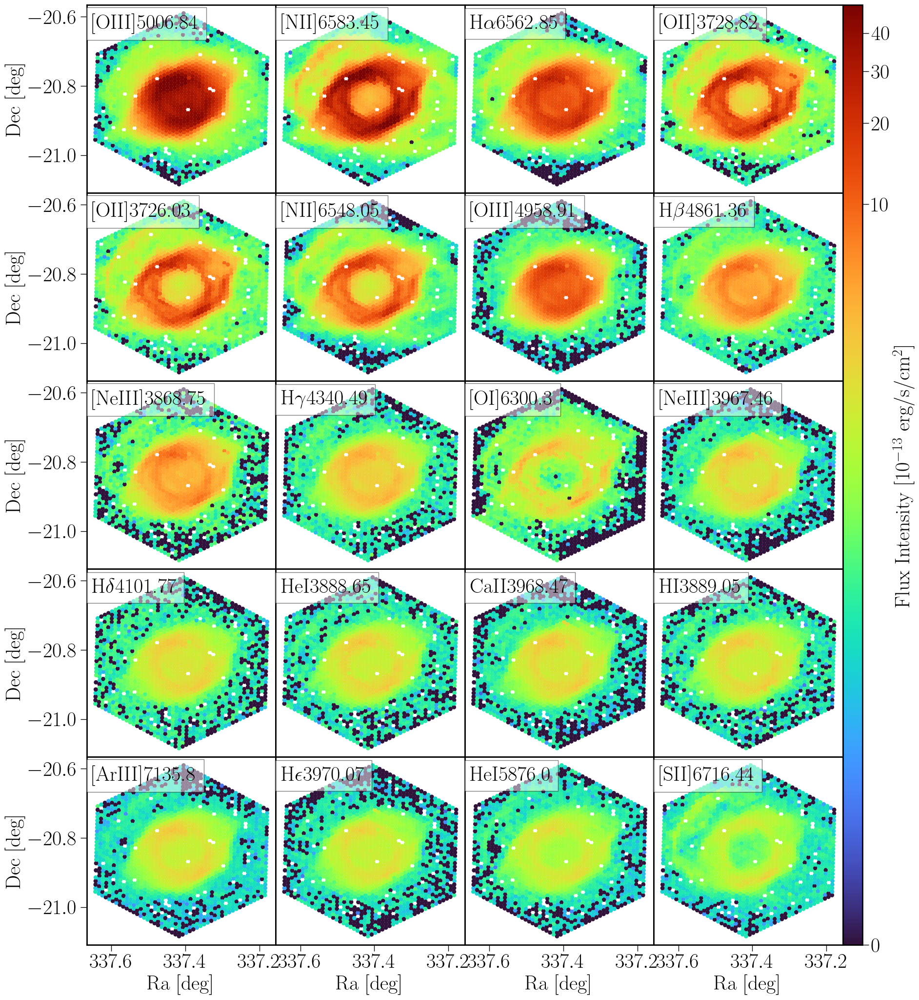

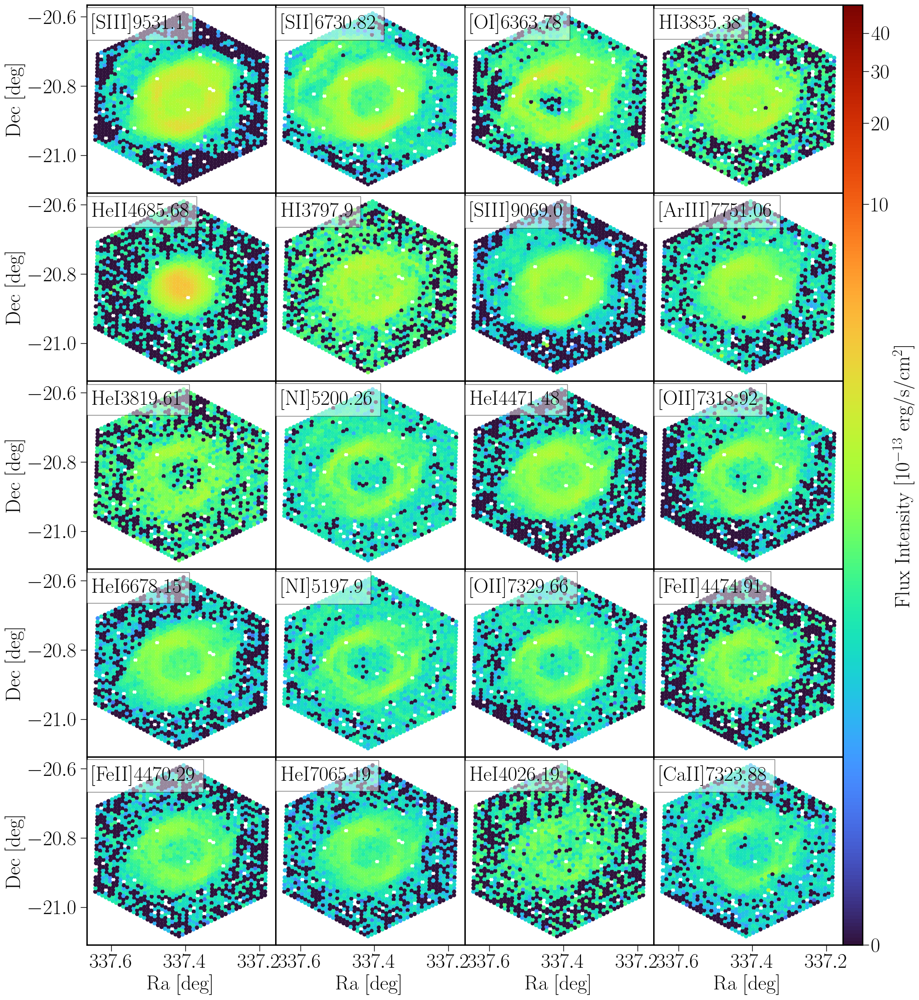

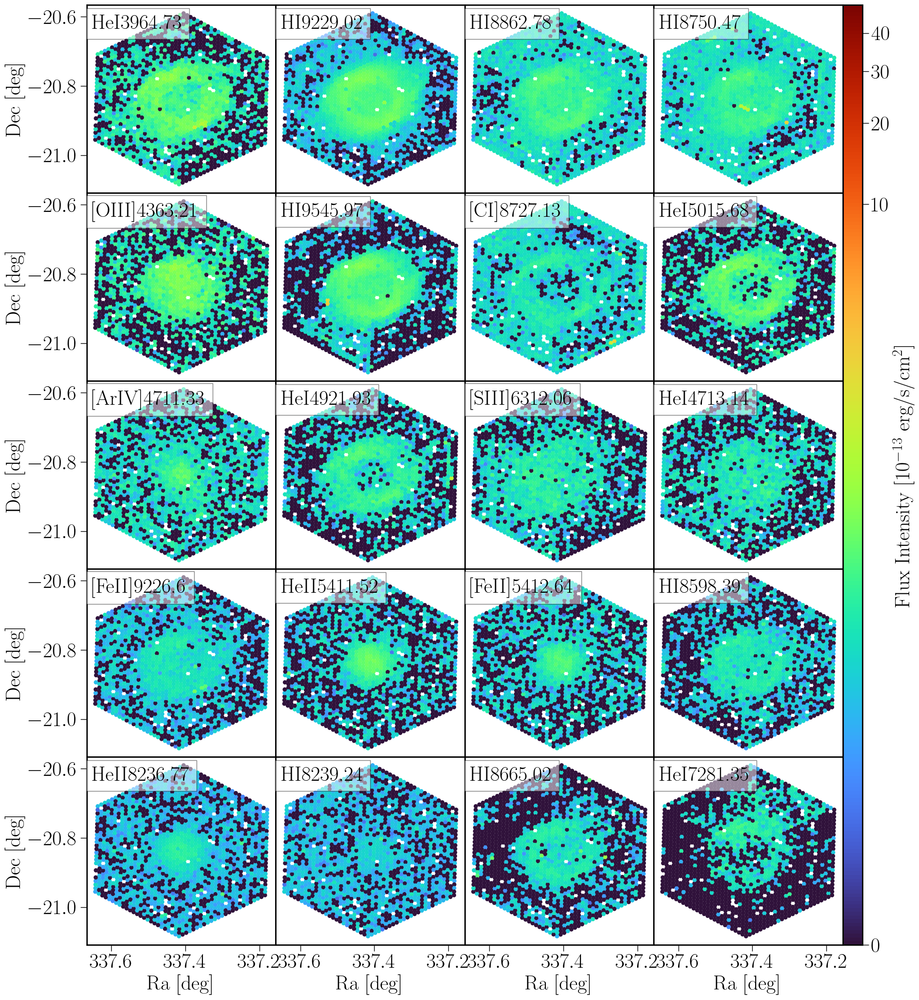

In [105]:
#cmap='gnuplot2_r'
#gamma=0.15
#cmap='pink_r'
#cmap='Spectral'
#cmap='nipy_spectral_r'
#cmap='cubehelix_r'
#cmap='terrain_r'
#fig = plt.figure()
NX=4
NY=5
I_now=0

tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))
tab_sum_flux.sort('flux',reverse=True)
cax_pos = 1
for I0 in np.arange(0,len(tab_sum_flux),NX*NY):
    fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


    #axs_flat = axs.flatten
    for I,ax in enumerate(np.ravel(axs)):
        #print(ax)
        I_now = I0 + I
        if (I_now >= len(tab_sum_flux)):
            ax.set_yticks([])
            ax.set_xticks([])
            ax.set_axis_off()
            cax_pos = 2

#            break
        else:
            tab_now=tab_sum_flux[I+I0]
            eline=tab_now['eline']
            wave=np.ceil(tab_now['wave'])
            II=str(I)
            if (I<10):
                II='0'+str(I)
            filename=f'Helix_{II}_{wave}'
            title=eline.replace('flux_','')
            title=title.replace('_','')
            title=title.replace('flux','')
            title=title.replace('alpha','$\\alpha$')
            title=title.replace('beta','$\\beta$')
            title=title.replace('gamma','$\\gamma$')    
            title=title.replace('delta','$\\delta$')
            title=title.replace('epsilon','$\\epsilon$')    
            xlab = False
            ylab = False
            if ((I/NX)==int(I/NX)):
                ylab=True
            else:
                ax.set_yticks([])
            if (I>=(NX*NY-4)):
                xlab=True
            else:
                ax.set_xticks([])                
            vmin=0
            vmax=0.49e5
        
            scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                             vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
        
#        scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline,vmin=0, vmax=vmax, title=title, filename=filename, cmap=cmap, fsize=6.5,\
#                             figs_dir='figs',gamma=gamma,fig_type='pdf',xlab=xlab,ylab=ylab,sf=2.8)
        xx = ax.get_xlim()
        yy = ax.get_ylim()
        #print(xx,yy)
    if (cax_pos == 1):
        cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
    else:
        cax = fig.add_axes([0.9, 0.2645, 0.02, 0.615])  # Ajusta estos valores según necesites
    #cax = fig.add_axes([0.9, 0.125, 0.02, 0.755])     
#    cax = fig.add_axes([0.9, 0.11, 0.02, 0.77]) 
#    cax = fig.add_axes([0.9, 0.125, 0.02, 0.76])  # Ajusta estos valores según necesites
    cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
    cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
    plt.subplots_adjust(wspace=0,hspace=0)
    plt.show()    
    #fig.tight_layout(w_pad=0.2)
    fig.savefig(f'figs/Helix_felines_{I_now}.pdf', facecolor='white')
    I_now=I_now+1

#if (I>3):
    #    break

In [155]:
tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))

# NP good lines:  60


In [156]:
tab_DAP['flux_pe_6562.68']=tab_DAP['flux_pe_6562.85']
tab_DAP['e_flux_pe_6562.68']=tab_DAP['e_flux_pe_6562.85']


In [157]:
#
# Write table Latex
#

tab_fe = Table.read('output_dap/m_Helix_DR19_new.fe.ecsv')
n_cut=0

a_name=[]
a_flux=[]
a_e_flux=[]
for cols in tab_fe.colnames:
    if ((cols.find('flux_')>-1)&(cols.find('e_')==-1)):
        e_cols=f'e_{cols}'
#        print(cols,e_cols)
        title=cols.replace('flux_','')
        title=title.replace('_','')
        title=title.replace('flux','')
        title=title.replace('alpha','$\\alpha$')
        title=title.replace('beta','$\\beta$')
        title=title.replace('gamma','$\\gamma$')    
        title=title.replace('delta','$\\delta$')
        title=title.replace('epsilon','$\\epsilon$')   
        flux = tab_fe[cols].value[0]/1000
        e_flux = tab_fe[e_cols].value[0]/1000
        if (flux>5*e_flux):
#            print(f'{title} {flux} {e_flux}'
            a_name.append(title)
            a_flux.append(flux)
            a_e_flux.append(e_flux)
            n_cut=n_cut+1

a_name=np.array(a_name)
a_flux=np.array(a_flux)
a_e_flux=np.array(a_e_flux)
print(n_cut)
        
#mask_fe = (tab_fe.colnames == 'flux_') & (tab_fe.colnames = 'flux_')


40


In [158]:
tab_sum_flux

eline,wave,flux,e_flux,good,corr_sky
str21,float64,float64,float64,int64,int64
flux_[OII]_3726.03,3726.03,4693410.237035557,4692.826059563782,1,0
flux_[OII]_3728.82,3728.82,6142612.791323947,4434.13415556236,1,0
flux_HI_3797.9,3797.9,228183.4662137273,7717.169754862874,1,0
flux_HeI_3819.61,3819.61,154665.3977650107,29180.87323759159,1,0
flux_HI_3835.38,3835.38,249727.96352876656,19925.239853372812,1,0
flux_[NeIII]_3868.75,3868.75,2100798.04549238,6034.0402082151095,1,0
flux_HeI_3888.65,3888.65,637414.581657584,3380.940786441261,1,0
flux_HI_3889.05,3889.05,613356.0795513729,3429.4005929145374,1,0
flux_HeI_3964.73,3964.73,72078.37519081046,3486.743872143744,1,0


In [159]:
flux_int = []
e_flux_int = []
for cols in tab_sum_flux['eline']:
    e_cols = 'e_'+cols
    flux_now = tab_fe[cols]
    e_flux_now = tab_fe[e_cols]
    flux_int.append(flux_now)
    e_flux_int.append(e_flux_now**2)
flux_int = np.array(flux_int)#.flatten()/1000
e_flux_int = np.array(e_flux_int)#.flatten()/1000
#tab_flux_sum['flux_int'] = 
tab_sum_flux['flux_int'] = flux_int
tab_sum_flux['e_flux_int'] = e_flux_int


In [160]:
tab_sum_flux.sort('wave')
tab_sum_flux

eline,wave,flux,e_flux,good,corr_sky,flux_int,e_flux_int
str21,float64,float64,float64,int64,int64,float64[1],float64[1]
flux_[OII]_3726.03,3726.03,4693410.237035557,4692.826059563782,1,0,1214.3774048310981,243.82586939107097
flux_[OII]_3728.82,3728.82,6142612.791323947,4434.13415556236,1,0,1338.7092486303352,258.09302999194557
flux_HI_3797.9,3797.9,228183.4662137273,7717.169754862874,1,0,73.16777650984488,914.0304432489728
flux_HeI_3819.61,3819.61,154665.3977650107,29180.87323759159,1,0,29.254293905919678,19469.15646574634
flux_HI_3835.38,3835.38,249727.96352876656,19925.239853372812,1,0,87.36747711770971,7788.3733252881875
flux_[NeIII]_3868.75,3868.75,2100798.04549238,6034.0402082151095,1,0,615.9526034210301,248.4042807061205
flux_HeI_3888.65,3888.65,637414.581657584,3380.940786441261,1,0,274.3555149200808,176.3342506645558
flux_HI_3889.05,3889.05,613356.0795513729,3429.4005929145374,1,0,263.7508966962605,186.42602122991022
flux_HeI_3964.73,3964.73,72078.37519081046,3486.743872143744,1,0,27.68305219679674,191.06420335119097


/tmp/ipykernel_160355/3450858790.py:2: RuntimeWarning: invalid value encountered in log10
  ax.scatter(np.log10(tab_sum_flux['flux']),np.log10(tab_sum_flux['flux_int']*1000))
/tmp/ipykernel_160355/3450858790.py:9: RuntimeWarning: invalid value encountered in log10
  ax.text(np.log10(flux),np.log10(flux_int*1000),f'{eline}',fontsize=8)
posx and posy should be finite values
posx and posy should be finite values


60


posx and posy should be finite values


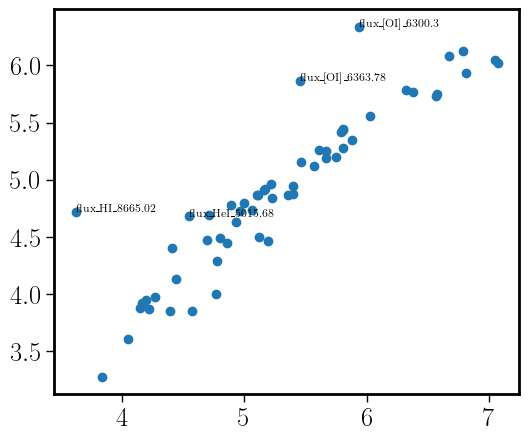

In [161]:
fig,ax = plt.subplots(1,1,figsize=(6,5))
ax.scatter(np.log10(tab_sum_flux['flux']),np.log10(tab_sum_flux['flux_int']*1000))
a_name=[]
a_flux=[]
a_e_flux=[]
n_cut = 0
for flux,e_flux,flux_int,eline in zip(tab_sum_flux['flux'],tab_sum_flux['e_flux'],tab_sum_flux['flux_int'],tab_sum_flux['eline']):
    if (flux_int>flux/1000):
        ax.text(np.log10(flux),np.log10(flux_int*1000),f'{eline}',fontsize=8)

    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')   
    a_name.append(title)
    a_flux.append(flux/1000)
    a_e_flux.append(e_flux/1000)
    n_cut=n_cut+1

a_name=np.array(a_name)
a_flux=np.array(a_flux)
a_e_flux=np.array(a_e_flux)
print(n_cut)



#print(len(tab_sum_flux))

In [178]:
aa_name=[]
aa_wave=[]

for I in range(n_cut):
    wave=''.join(filter(str.isdigit, a_name[I]))
    name=''.join(filter(lambda c: not c.isdigit(), a_name[I]))
    name = name.replace('.','')
    name = name.replace('[','$[$\ION{')
    name = name.replace(']','}{}$]$')

    if (len(wave)==5):
        wave = wave+'0'
    wave=np.around(float(wave)/100,2)
    print(f'{name} {wave}')
    aa_name.append(name)
    aa_wave.append(wave)
aa_name=np.array(aa_name)
aa_wave=np.array(aa_wave)

$[$\ION{OII}{}$]$ 3726.03
$[$\ION{OII}{}$]$ 3728.82
HI 3797.9
HeI 3819.61
HI 3835.38
$[$\ION{NeIII}{}$]$ 3868.75
HeI 3888.65
HI 3889.05
HeI 3964.73
$[$\ION{NeIII}{}$]$ 3967.46
CaII 3968.47
H$\epsilon$ 3970.07
HeI 4026.19
H$\delta$ 4101.77
H$\gamma$ 4340.49
$[$\ION{OIII}{}$]$ 4363.21
$[$\ION{FeII}{}$]$ 4470.29
HeI 4471.48
$[$\ION{FeII}{}$]$ 4474.91
HeII 4685.68
$[$\ION{ArIV}{}$]$ 4711.33
HeI 4713.14
H$\beta$ 4861.36
HeI 4921.93
$[$\ION{OIII}{}$]$ 4958.91
$[$\ION{OIII}{}$]$ 5006.84
HeI 5015.68
$[$\ION{NI}{}$]$ 5197.9
$[$\ION{NI}{}$]$ 5200.26
HeII 5411.52
$[$\ION{FeII}{}$]$ 5412.64
HeI 5876.0
$[$\ION{OI}{}$]$ 6300.3
$[$\ION{SIII}{}$]$ 6312.06
$[$\ION{OI}{}$]$ 6363.78
$[$\ION{NII}{}$]$ 6548.05
H$\alpha$ 6562.85
$[$\ION{NII}{}$]$ 6583.45
HeI 6678.15
$[$\ION{SII}{}$]$ 6716.44
$[$\ION{SII}{}$]$ 6730.82
HeI 7065.19
$[$\ION{ArIII}{}$]$ 7135.8
HeI 7281.35
$[$\ION{OII}{}$]$ 7318.92
$[$\ION{CaII}{}$]$ 7323.88
$[$\ION{OII}{}$]$ 7329.66
$[$\ION{ArIII}{}$]$ 7751.06
HeII 8236.77
HI 8239.24
HI 8598.39


In [179]:
#n_cut=len(tab_sum_flux)


n_c=int(n_cut/3)
for I in range(n_c):
    print(' %s  &  %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I],aa_wave[I],a_flux[I],a_e_flux[I]),end='')
    print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I+n_c],aa_wave[I],a_flux[I+n_c],a_e_flux[I+n_c]),end='')
    print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f \\\\' % (aa_name[I+2*n_c],aa_wave[I],a_flux[I+2*n_c],a_e_flux[I+2*n_c]))

    

 $[$\ION{OII}{}$]$  &  3726.03 & 4693.41  $\pm$  4.69& $[$\ION{ArIV}{}$]$  & 3726.03 & 27.89  $\pm$  2.56& $[$\ION{SII}{}$]$  & 3726.03 & 289.99  $\pm$  1.81 \\
 $[$\ION{OII}{}$]$  &  3728.82 & 6142.61  $\pm$  4.43& HeI  & 3728.82 & 18.75  $\pm$  2.81& HeI  & 3728.82 & 85.28  $\pm$  2.03 \\
 HI  &  3797.90 & 228.18  $\pm$  7.72& H$\beta$  & 3797.90 & 2382.05  $\pm$  7.82& $[$\ION{ArIII}{}$]$  & 3797.90 & 560.93  $\pm$  1.54 \\
 HeI  &  3819.61 & 154.67  $\pm$ 29.18& HeI  & 3819.61 & 25.79  $\pm$ 23.72& HeI  & 3819.61 & -22.29  $\pm$  2.93 \\
 HI  &  3835.38 & 249.73  $\pm$ 19.93& $[$\ION{OIII}{}$]$  & 3835.38 & 3690.28  $\pm$ 83.85& $[$\ION{OII}{}$]$  & 3835.38 & 131.56  $\pm$  3.42 \\
 $[$\ION{NeIII}{}$]$  &  3868.75 & 2100.80  $\pm$  6.03& $[$\ION{OIII}{}$]$  & 3868.75 & 11820.86  $\pm$ 25.52& $[$\ION{CaII}{}$]$  & 3868.75 & 74.95  $\pm$  2.90 \\
 HeI  &  3888.65 & 637.41  $\pm$  3.38& HeI  & 3888.65 & 35.06  $\pm$ 41.98& $[$\ION{OII}{}$]$  & 3888.65 & 116.03  $\pm$  2.41 \\
 HI  &  

In [113]:
#list_columns(tab_fe.colnames)

In [114]:
#n=len(tab_fe.colnames)
#n_fe=int(n/8)
#print(n/2/4,n_fe)

In [115]:
for I in range(n_cut):
    if (a_name[I].find('beta')>-1):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        FHb = a_flux[I]
        e_FHb = a_e_flux[I]
        
for I in range(n_cut):
    if ((a_name[I].find('alpha')>-1) or (a_name[I].find('gamma')>-1) or (a_name[I].find('delta')>-1) or (a_name[I].find('epsilon')>-1) or (a_name[I].find('HI')>-1)):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        rat = a_flux[I]/FHb
        e_rat = a_e_flux[I]/FHb+e_FHb*rat/FHb
        print(' %s/H$\\beta$  & %5.2f $\pm$ %5.2f' % (a_name[I],rat,e_rat))
        
        

 HI3797.9/H$\beta$  &  0.10 $\pm$  0.00
 HI3835.38/H$\beta$  &  0.10 $\pm$  0.01
 HI3889.05/H$\beta$  &  0.26 $\pm$  0.00
 H$\epsilon$3970.07/H$\beta$  &  0.19 $\pm$  0.00
 H$\delta$4101.77/H$\beta$  &  0.27 $\pm$  0.00
 H$\gamma$4340.49/H$\beta$  &  0.45 $\pm$  0.00
 H$\alpha$6562.85/H$\beta$  &  2.72 $\pm$  0.01
 HI8239.24/H$\beta$  &  0.00 $\pm$  0.00
 HI8598.39/H$\beta$  &  0.01 $\pm$  0.00
 HI8665.02/H$\beta$  &  0.00 $\pm$  0.00
 HI8750.47/H$\beta$  &  0.02 $\pm$  0.00
 HI8862.78/H$\beta$  &  0.03 $\pm$  0.00
 HI9229.02/H$\beta$  &  0.03 $\pm$  0.00
 HI9545.97/H$\beta$  &  0.02 $\pm$  0.00


In [116]:
search_col(tab_DAP,'_st')

Av_st
e_Av_st
z_st
e_z_st
disp_st
e_disp_st
flux_st
redshift_st
med_flux_st
e_med_flux_st
vel_st
X_sq_st
X_sq_st_np
X_sq_st_pek


['Av_st',
 'e_Av_st',
 'z_st',
 'e_z_st',
 'disp_st',
 'e_disp_st',
 'flux_st',
 'redshift_st',
 'med_flux_st',
 'e_med_flux_st',
 'vel_st',
 'X_sq_st',
 'X_sq_st_np',
 'X_sq_st_pek']

In [117]:
#
# Stars with SN>5
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 5
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]

In [118]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


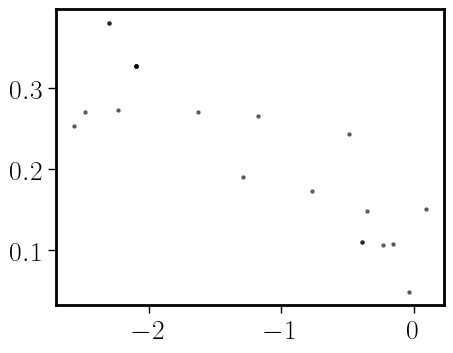

In [119]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],s=5,c='black',alpha=0.5)

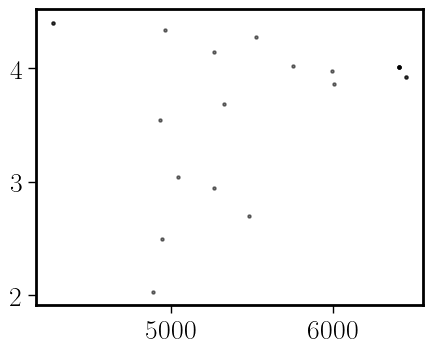

In [120]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Teff'],tab_DAP_st['Log_g'],s=5,c='black',alpha=0.5)

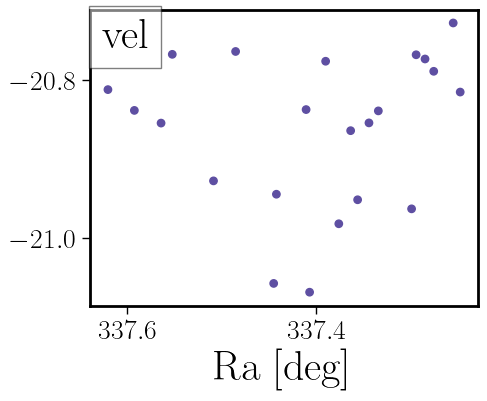

In [121]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP_st,ax=ax,fig=fig,line='vel_st', \
                 vmin=-100, vmax=0, title='vel', filename=filename,\
             cmap='Spectral', fsize=6.5, figs_dir='figs',gamma=1.0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)

In [122]:
tab_DAP_st['vel_st']

-7.724946109062687
-7.724946109062687
57.21852173534935
57.21852173534935
57.21852173534935
57.21852173534935
57.21852173534935
57.21852173534935
-40.044693266116205
-40.044693266116205
-40.044693266116205


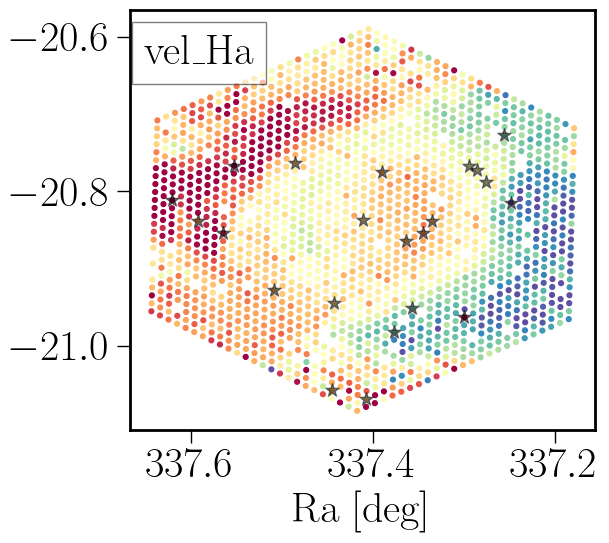

In [123]:
fig, ax = plt.subplots(1,1,figsize=(6,6/1.1))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_pek_6562.85', \
                 vmin=-50, vmax=10, title='vel_Ha', filename=filename,\
             cmap='Spectral', fsize=3.5, figs_dir='figs',gamma=1,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.18,fs=fs,\
                        f_scale=1)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=100,marker='*',c='black',alpha=0.5)


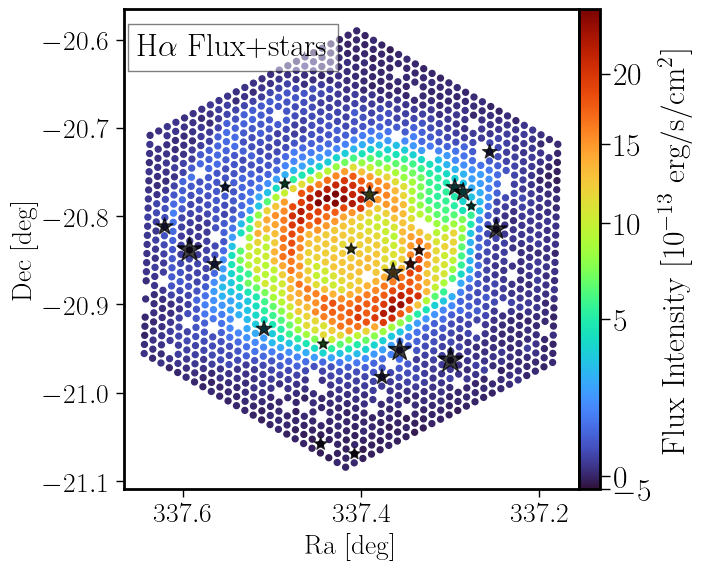

In [124]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

def add_inch_sized_axes(fig, *, width_in, height_in, left_margin_in, bottom_margin_in):
    """
    Exact inch sizing (useful for publication).
    """
    fig_w_in, fig_h_in = fig.get_size_inches()
    w_frac = width_in / fig_w_in
    h_frac = height_in / fig_h_in
    l_frac = left_margin_in / fig_w_in
    b_frac = bottom_margin_in / fig_h_in
    return fig.add_axes([l_frac, b_frac, w_frac, h_frac])

fig = plt.figure(figsize=(7, 6))
ax = fig.add_axes([0.17, 0.15, 0.65, 0.8])  # left, bottom, width, height
#fig, ax = plt.subplots(1,1,figsize=(7,6))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='flux_pek_6562.85', \
                 vmin=-100/f_scale, vmax=24999/f_scale, title=r'H$\alpha$ Flux+stars', filename=filename,\
             cmap='turbo', fsize=5.5, figs_dir='figs',gamma=0.65,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.8,fs=fs*0.75,\
                        f_scale=f_scale)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=2*(tab_DAP_st['SN_st'])*5,marker='*',c='black',\
           edgecolor='black',alpha=0.75)

#xcx= divider.append_axes("right", 0.15, pad=0.05)
cax = fig.add_axes([0.82, 0.15, 0.03, 0.8])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=ax, orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
ax.set_xlabel('Ra [deg]',fontsize=20)
ax.set_ylabel('Dec [deg]',fontsize=20)
#plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/Helix_DR19_stars.pdf', facecolor='white')


vel_pek_6562.85 -50 10


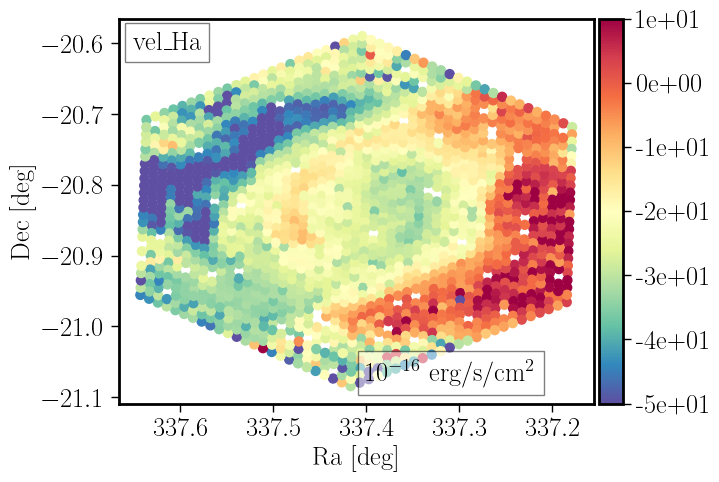

In [125]:
map_plot_DAP(tab_DAP,line='vel_pek_6562.85', \
                 vmin=-50, vmax=10, title='vel_Ha', filename=filename,\
             cmap='Spectral_r', fsize=6.5, figs_dir='figs',gamma=1,fig_type='pdf',\
                        sf=1.28)

In [126]:
tab_DAP_st['id','ra','dec','fiberid']

id,ra,dec,fiberid
str9,float64,float64,int64
4297.1082,337.35625730138355,-20.95173144306547,1082
4297.1115,337.3761429656673,-20.982208018169562,1115
4297.1144,337.2992377886743,-20.963262501206273,1144
4297.1246,337.40699272296825,-21.0691085695338,1246
4297.1558,337.48517200519245,-20.76342537628772,1558
4297.1648,337.39005306831,-20.775840644589167,1648
4297.1706,337.29444839715546,-20.76760754853941,1706
4297.1808,337.255272926721,-20.72722878995961,1808
4297.224,337.50852244124655,-20.927752392840127,224


In [127]:
from astropy.table import Table

# Calculate the Euclidean distance
tab_DAP_st['distance'] = ((tab_DAP_st['ra'] - 337.4)**2 + (tab_DAP_st['dec'] - (-20.85))**2)**0.5

# Find the row with the minimum distance
nearest_row = tab_DAP_st[np.argmin(tab_DAP_st['distance'])]

print(nearest_row)

   id            ra               dec         mask fiberid exposure     MIN_CHISQ            Teff       e_Teff       Log_g       e_Log_g          Fe         e_Fe        alpha        e_alpha Av_st e_Av_st           z_st          e_z_st      disp_st      e_disp_st      flux_st            redshift_st          med_flux_st       e_med_flux_st        Teff_MW      e_Teff_MW      Log_g_MW     e_Log_g_MW        Fe_MW        e_Fe_MW       alpha_MW      e_alpha_MW       vel_st             log_ML            log_Mass       flux_HI_3686.83   flux_HI_3691.56    flux_HI_3697.15    flux_HI_3703.85     flux_HI_3711.97   flux_[OII]_3726.03 flux_[OII]_3728.82  flux_HI_3734.37    flux_HI_3750.15   flux_[FeVII]_3758.9  flux_HI_3770.63     flux_HI_3797.9    flux_HeI_3819.61   flux_HI_3835.38  flux_[NeIII]_3868.75  flux_HeI_3888.65  flux_HI_3889.05  flux_CaII_3933.66   flux_HeI_3964.73 flux_[NeIII]_3967.46 flux_CaII_3968.47 flux_Hepsilon_3970.07  flux_HeI_4026.19  flux_[SII]_4068.6  flux_[SII]_4076.35 flux_Hd

vel_st -150 50


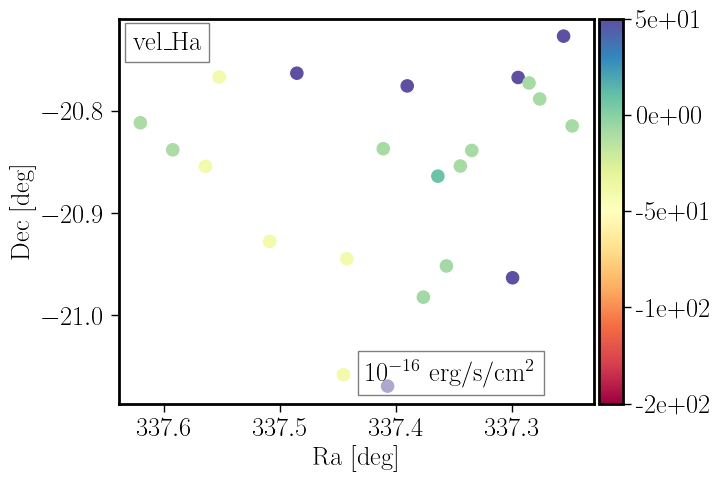

In [128]:
map_plot_DAP(tab_DAP_st,line='vel_st', \
                 vmin=-150, vmax=50, title='vel_Ha', filename=filename,\
             cmap='Spectral', fsize=6.5, figs_dir='figs',gamma=1,fig_type='pdf',\
                        sf=1.2)

(array([ 41.,  45., 110., 287., 523., 301., 230., 159.,  49.,   9.]),
 array([-71.0533 , -61.20899, -51.36468, -41.52037, -31.67606, -21.83175,
        -11.98744,  -2.14313,   7.70118,  17.54549,  27.3898 ]),
 <BarContainer object of 10 artists>)

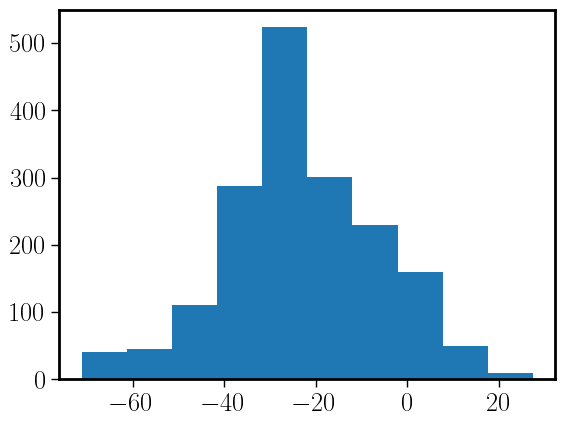

In [129]:
plt.hist(tab_DAP['vel_pek_6562.85'])

(array([ 5.,  0.,  0., 10.,  0.,  1.,  0.,  0.,  0.,  6.]),
 array([-40.04469327, -30.31837177, -20.59205027, -10.86572877,
         -1.13940727,   8.58691423,  18.31323573,  28.03955723,
         37.76587874,  47.49220024,  57.21852174]),
 <BarContainer object of 10 artists>)

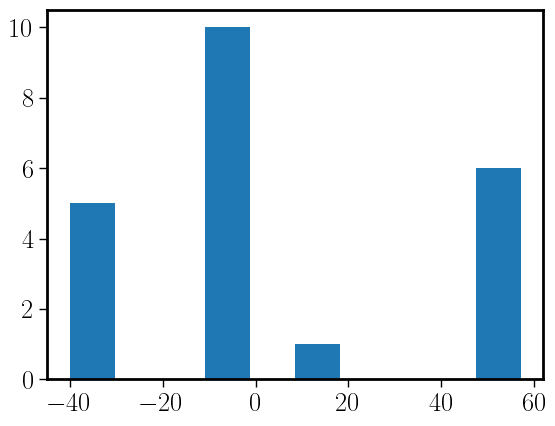

In [130]:
plt.hist(tab_DAP_st['vel_st'])

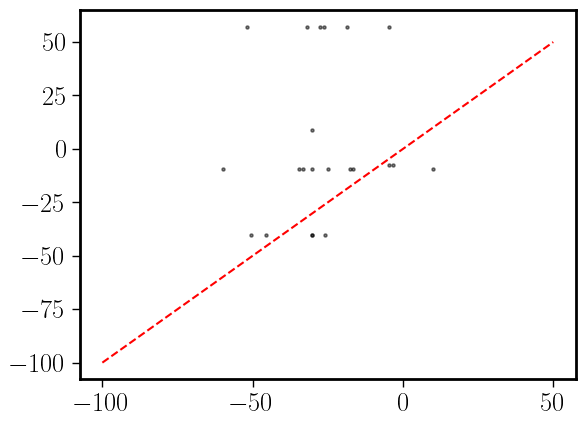

In [131]:
plt.scatter(tab_DAP_st['vel_pek_6562.85'],tab_DAP_st['vel_st'],s=5,c='black',alpha=0.5)
plt.plot([-100,50],[-100,50],'r--')

(0.0, 2.5)

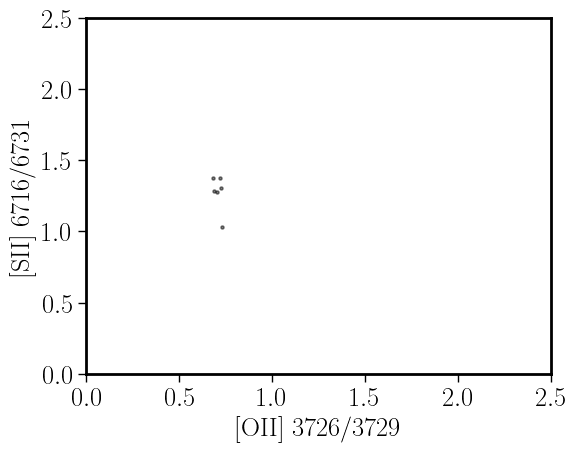

In [132]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 100
ax.scatter((tab_DAP['flux_pek_3726.03']/tab_DAP['flux_pek_3728.82'])[mask_SN_Ha],
           (tab_DAP['flux_[SII]_6716.44']/tab_DAP['flux_[SII]_6730.82'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'[OII] 3726/3729')
ax.set_ylabel(r'[SII] 6716/6731')
ax.set_xlim(0,2.5)
ax.set_ylim(0,2.5)


(2.01, 3.3)

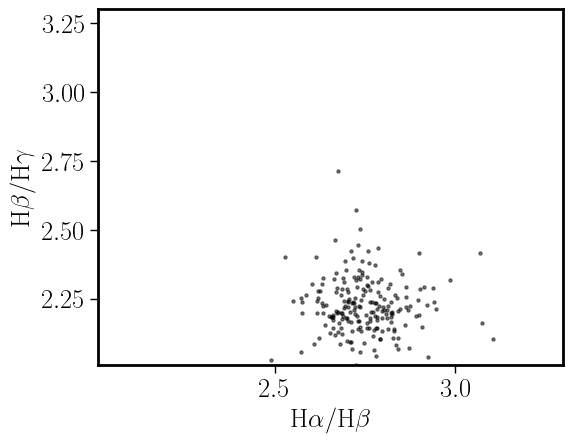

In [133]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pek_6562.85']/tab_DAP['e_flux_pek_6562.85'] > 30
ax.scatter((tab_DAP['flux_Halpha_6562.85']/tab_DAP['flux_Hbeta_4861.36'])[mask_SN_Ha],
           (tab_DAP['flux_Hbeta_4861.36']/tab_DAP['flux_Hgamma_4340.49'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'H$\alpha$/H$\beta$')
ax.set_ylabel(r'H$\beta$/H$\gamma$')
ax.set_xlim(2.01,3.3)
ax.set_ylim(2.01,3.3)


(0.0, 2.5)

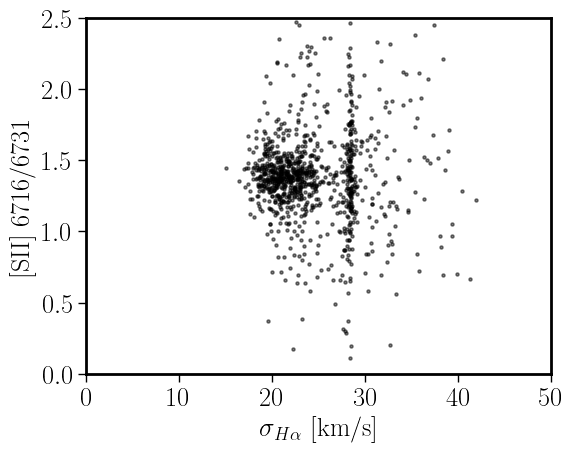

In [134]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           (tab_DAP['flux_[SII]_6716.44']/tab_DAP['flux_[SII]_6730.82'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[SII] 6716/6731')
ax.set_xlim(0,50)
ax.set_ylim(0,2.5)


/tmp/ipykernel_160355/1376233549.py:5: RuntimeWarning: invalid value encountered in log10
  np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],


(0.0, 50.0)

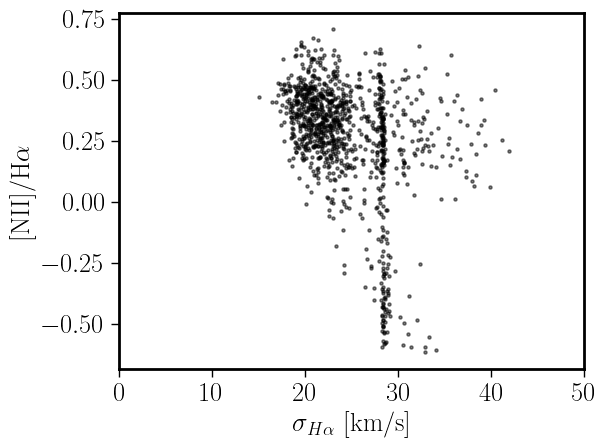

In [135]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[NII]/H$\alpha$')
ax.set_xlim(0,50)
#ax.set_ylim(0,2.5)

In [136]:
search_col(tab_DAP,'[OII]')

flux_[OII]_3726.03
flux_[OII]_3728.82
vel_[OII]_3726.03
vel_[OII]_3728.82
disp_[OII]_3726.03
disp_[OII]_3728.82
EW_[OII]_3726.03
EW_[OII]_3728.82
e_flux_[OII]_3726.03
e_flux_[OII]_3728.82
e_vel_[OII]_3726.03
e_vel_[OII]_3728.82
e_disp_[OII]_3726.03
e_disp_[OII]_3728.82
e_EW_[OII]_3726.03
e_EW_[OII]_3728.82
flux_[OII]_7318.92
flux_[OII]_7329.66
vel_[OII]_7318.92
vel_[OII]_7329.66
disp_[OII]_7318.92
disp_[OII]_7329.66
EW_[OII]_7318.92
EW_[OII]_7329.66
e_flux_[OII]_7318.92
e_flux_[OII]_7329.66
e_vel_[OII]_7318.92
e_vel_[OII]_7329.66
e_disp_[OII]_7318.92
e_disp_[OII]_7329.66
e_EW_[OII]_7318.92
e_EW_[OII]_7329.66
sigma_kms_[OII]_3726.03
sigma_kms_[OII]_3728.82
sigma_kms_[OII]_7318.92
sigma_kms_[OII]_7329.66
X_sq_[OII]_3726.03
X_sq_[OII]_3728.82
X_sq_[OII]_7318.92
X_sq_[OII]_7329.66


['flux_[OII]_3726.03',
 'flux_[OII]_3728.82',
 'vel_[OII]_3726.03',
 'vel_[OII]_3728.82',
 'disp_[OII]_3726.03',
 'disp_[OII]_3728.82',
 'EW_[OII]_3726.03',
 'EW_[OII]_3728.82',
 'e_flux_[OII]_3726.03',
 'e_flux_[OII]_3728.82',
 'e_vel_[OII]_3726.03',
 'e_vel_[OII]_3728.82',
 'e_disp_[OII]_3726.03',
 'e_disp_[OII]_3728.82',
 'e_EW_[OII]_3726.03',
 'e_EW_[OII]_3728.82',
 'flux_[OII]_7318.92',
 'flux_[OII]_7329.66',
 'vel_[OII]_7318.92',
 'vel_[OII]_7329.66',
 'disp_[OII]_7318.92',
 'disp_[OII]_7329.66',
 'EW_[OII]_7318.92',
 'EW_[OII]_7329.66',
 'e_flux_[OII]_7318.92',
 'e_flux_[OII]_7329.66',
 'e_vel_[OII]_7318.92',
 'e_vel_[OII]_7329.66',
 'e_disp_[OII]_7318.92',
 'e_disp_[OII]_7329.66',
 'e_EW_[OII]_7318.92',
 'e_EW_[OII]_7329.66',
 'sigma_kms_[OII]_3726.03',
 'sigma_kms_[OII]_3728.82',
 'sigma_kms_[OII]_7318.92',
 'sigma_kms_[OII]_7329.66',
 'X_sq_[OII]_3726.03',
 'X_sq_[OII]_3728.82',
 'X_sq_[OII]_7318.92',
 'X_sq_[OII]_7329.66']

In [137]:
def rad_pro(ra_cen, dec_cen, tab_DAP, eline, delta_r, max_r, scale=1):
    ra = tab_DAP['ra']
    dec = tab_DAP['dec']
    r = np.sqrt((ra - ra_cen)**2 + (dec - dec_cen)**2)*scale
    n_r = int(max_r/delta_r)+1
    a_r = np.arange(n_r)*delta_r
    a_flux = np.zeros(n_r)
    a_e_flux = np.zeros(n_r)
    a_n = np.zeros(n_r,dtype=int)
    for I in range(n_r-1):
        if (I==0):
            mask_r = r <= a_r[I+1]
        else:
            mask_r = (r > a_r[I]) & (r <= a_r[I+1])
        a_n[I] = np.sum(mask_r)
        if (a_n[I]>0):
            a_flux[I] = np.nansum(tab_DAP[eline][mask_r])
            a_e_flux[I] = np.sqrt(np.nansum(tab_DAP[eline][mask_r]**2))
        else:
            a_flux[I] = 0
            a_e_flux[I] = 0
    return a_r, a_flux, a_e_flux, a_n

In [138]:
a_r, a_flux, a_e_flux, a_n = rad_pro(337.40479, -20.83775, tab_DAP, 'flux_pek_6562.85', 0.5, 25, scale=60)

In [139]:
tab_sum_flux
#print(tab_sum_flux['eline'])
#search_col(tab_DAP,'flux_')

eline,wave,flux,e_flux,good,corr_sky,flux_int,e_flux_int
str21,float64,float64,float64,int64,int64,float64[1],float64[1]
flux_[OII]_3726.03,3726.03,4693410.237035557,4692.826059563782,1,0,1214.3774048310981,243.82586939107097
flux_[OII]_3728.82,3728.82,6142612.791323947,4434.13415556236,1,0,1338.7092486303352,258.09302999194557
flux_HI_3797.9,3797.9,228183.4662137273,7717.169754862874,1,0,73.16777650984488,914.0304432489728
flux_HeI_3819.61,3819.61,154665.3977650107,29180.87323759159,1,0,29.254293905919678,19469.15646574634
flux_HI_3835.38,3835.38,249727.96352876656,19925.239853372812,1,0,87.36747711770971,7788.3733252881875
flux_[NeIII]_3868.75,3868.75,2100798.04549238,6034.0402082151095,1,0,615.9526034210301,248.4042807061205
flux_HeI_3888.65,3888.65,637414.581657584,3380.940786441261,1,0,274.3555149200808,176.3342506645558
flux_HI_3889.05,3889.05,613356.0795513729,3429.4005929145374,1,0,263.7508966962605,186.42602122991022
flux_HeI_3964.73,3964.73,72078.37519081046,3486.743872143744,1,0,27.68305219679674,191.06420335119097


In [140]:
#


In [141]:
tab_DAP_cor = tab_DAP['ra','dec']
for cols in tab_sum_flux['eline']:
    e_cols = 'e_'+cols
    print(cols)
    tab_DAP_cor[cols] = tab_DAP[cols]
    tab_DAP_cor[e_cols] = tab_DAP[e_cols]
print(len(tab_DAP_cor.colnames))

flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_Hdelta_4101.77
flux_Hgamma_4340.49
flux_[OIII]_4363.21
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_HeII_4685.68
flux_[ArIV]_4711.33
flux_HeI_4713.14
flux_Hbeta_4861.36
flux_HeI_4921.93
flux_[OIII]_4958.91
flux_[OIII]_5006.84
flux_HeI_5015.68
flux_[NI]_5197.9
flux_[NI]_5200.26
flux_HeII_5411.52
flux_[FeII]_5412.64
flux_HeI_5876.0
flux_[OI]_6300.3
flux_[SIII]_6312.06
flux_[OI]_6363.78
flux_[NII]_6548.05
flux_Halpha_6562.85
flux_[NII]_6583.45
flux_HeI_6678.15
flux_[SII]_6716.44
flux_[SII]_6730.82
flux_HeI_7065.19
flux_[ArIII]_7135.8
flux_HeI_7281.35
flux_[OII]_7318.92
flux_[CaII]_7323.88
flux_[OII]_7329.66
flux_[ArIII]_7751.06
flux_HeII_8236.77
flux_HI_8239.24
flux_HI_8598.39
flux_HI_8665.02
flux_[CI]_8727.13
flux_HI_8750.47
flux_HI_88

In [ ]:
#print(len(tab_DAP_cor))

1754


In [143]:
tab_DAP_cor.write('output_dap/Helix_DR19_cor.fits.gz',overwrite=True)

In [144]:
tab_DAP_add = tab_DAP_cor.copy()

#flux_[OII]_3726.03
#flux_[OII]_3728.82

tab_DAP_add['OII'] = tab_DAP_cor['flux_[OII]_3726.03'] + tab_DAP_cor['flux_[OII]_3728.82']
tab_DAP_add['e_OII'] = np.sqrt(tab_DAP_cor['e_flux_[OII]_3726.03']**2 + tab_DAP_cor['e_flux_[OII]_3728.82']**2)
tab_DAP_add['SII'] = tab_DAP_cor['flux_[SII]_6716.44'] + tab_DAP_cor['flux_[SII]_6730.82']
tab_DAP_add['e_SII'] = np.sqrt(tab_DAP_cor['e_flux_[SII]_6716.44']**2 + tab_DAP_cor['e_flux_[SII]_6730.82']**2)



In [145]:
search_col(tab_DAP_add,'SIII')

flux_[SIII]_6312.06
e_flux_[SIII]_6312.06
flux_[SIII]_9069.0
e_flux_[SIII]_9069.0
flux_[SIII]_9531.1
e_flux_[SIII]_9531.1


['flux_[SIII]_6312.06',
 'e_flux_[SIII]_6312.06',
 'flux_[SIII]_9069.0',
 'e_flux_[SIII]_9069.0',
 'flux_[SIII]_9531.1',
 'e_flux_[SIII]_9531.1']

/tmp/ipykernel_160355/4220260372.py:35: RuntimeWarning: divide by zero encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \
/tmp/ipykernel_160355/4220260372.py:35: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \


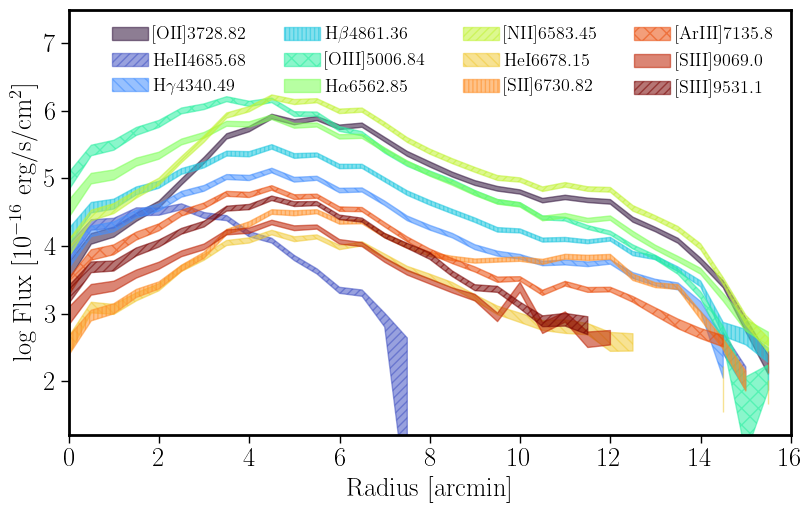

In [146]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']

for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux [10$^{-16}$ erg/s/cm$^2$]')
ax.set_xlim(0,16)
ax.set_ylim(1.21,7.49)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/rad_flux.pdf', facecolor='white')


/tmp/ipykernel_160355/434283722.py:36: RuntimeWarning: invalid value encountered in divide
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\
/tmp/ipykernel_160355/434283722.py:37: RuntimeWarning: invalid value encountered in divide
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \
/tmp/ipykernel_160355/434283722.py:36: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\
/tmp/ipykernel_160355/434283722.py:37: RuntimeWarning: invalid value encountered in log10
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \


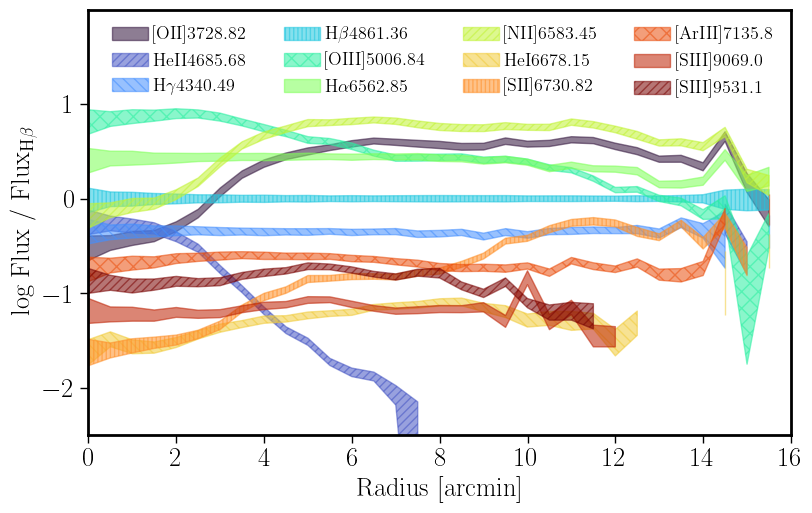

In [147]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']
a_r_hb, a_flux_hb, a_e_flux_hb, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add,\
                                               'flux_Hbeta_4861.36', d_r, r_max, scale=scale)
for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\
                     np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux / Flux$_{\\rm H\\beta}$')
ax.set_xlim(0,16)
ax.set_ylim(-2.49,1.99)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/rad_rat.pdf', facecolor='white')


In [148]:
search_col(tab_DAP_add,'gamma')

flux_Hgamma_4340.49
e_flux_Hgamma_4340.49


['flux_Hgamma_4340.49', 'e_flux_Hgamma_4340.49']

In [149]:
#
# Spectral plots
#
from astropy.io import fits
n_sp = 1
#hdu=fits.open('output_dap/dap-00006109.output.fits.gz');
#hdu=fits.open('output_dap/Helix_DR19_new.output.fits.gz')
hdu=fits.open('output_dap/Helix_DR19_gen_mod.output.fits.gz')
print(hdu[0].data.shape)
wave = hdu[0].header['CRVAL1']+hdu[0].header['CDELT1']*np.arange(hdu[0].data.shape[2])




(9, 1754, 12401)


In [150]:
mask_SN_st = tab_DAP['SN_st'] > 5
data_st = hdu[0].data[:, mask_SN_st, :]
hdr = hdu[0].header
data_st.shape

#hdu.close()



(9, 22, 12401)

#fig,axs = plt.subplots(2,3,figsize=(15,10))

n_p = 2
n_max_p = 10
i_max_p = 0
i_ax = 0
print(n_max_p)
fig=plt.figure(figsize=(14,7))
width=0.32
xstart=0.02
gamma=0.25
#left=[xstart,xstart+width,xstart+2*width]
left=[xstart,xstart+width]
#width=[0.25,0.25,0.25]
ax=[]
for x in left:
    y=0.1
    print(x,y)
    ax.append(fig.add_axes([x, y, width, 0.85]))

#fig,ax = plt.subplots(1,n_p,figsize=(18,8))
I=0
# for I,cluster_now in enumerate(np.arange(0,n_clusters,d_cl)):
for cluster_now,tab_DAP_now in enumerate(tab_DAP_st):
    ax_now=ax[i_ax]
    try:
        spec2D = data_st[:,cluster_now,:]
        scale_s = np.median(spec2D[0,:][(wave>5000)&(wave<5500)])
        scale_s1 = np.median(spec2D[1,:][(wave>5000)&(wave<5500)])
        if (scale_s1>0):
            spec_mean=spec2D[0,:]/scale_s
            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='k',alpha=1,linewidth=1.5)
#            spec_mean=(spec2D[7,:]+spec2D[1,:])/scale_s
#            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='blue',alpha=1,linewidth=1)
            spec_mean=spec2D[1,:]/scale_s
            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='tomato',alpha=1,linewidth=1)
            ax_now.set_yticks([])
            ax_now.set_xlim(3500,10799)
            ax_now.text(9900,1.2*I+0.2,f'\#{cluster_now}')
#            ax_now.set_xlim(3800,5200)
#            ax_now.text(5500,1.2*I+0.2,f'\#{cluster_now}')
            i_max_p=i_max_p+1
            I=I+10
    except:
        break


    if (i_max_p>=n_max_p):
        i_max_p=0
        i_ax=i_ax+1
        I=0
    #plt.show()
figname=f'Helix_DR19_st_spec'
fig.tight_layout()
fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")   

10
0.02 0.1
0.34 0.1


/tmp/ipykernel_160355/1619329781.py:32: RuntimeWarning: invalid value encountered in power
  ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='k',alpha=1,linewidth=1.5)
/tmp/ipykernel_160355/1619329781.py:34: RuntimeWarning: invalid value encountered in power
  ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='blue',alpha=1,linewidth=1)
/tmp/ipykernel_160355/1619329781.py:36: RuntimeWarning: invalid value encountered in power
  ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='tomato',alpha=1,linewidth=1)


IndexError: list index out of range

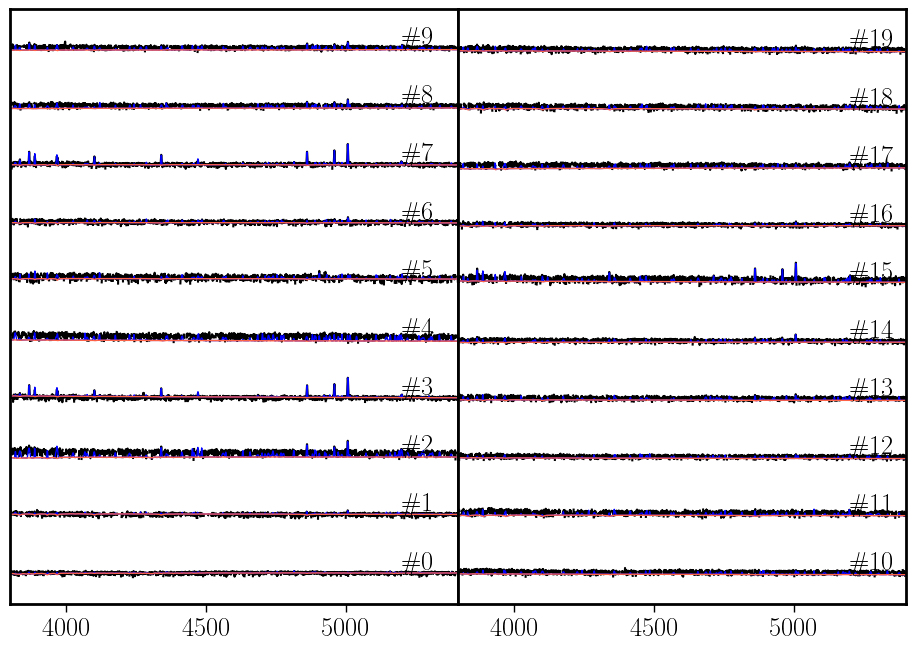

In [151]:
#fig,axs = plt.subplots(2,3,figsize=(15,10))

n_p = 2
n_max_p = 10
i_max_p = 0
i_ax = 0
print(n_max_p)
fig=plt.figure(figsize=(14,7))
width=0.32
xstart=0.02
gamma=0.25
#left=[xstart,xstart+width,xstart+2*width]
left=[xstart,xstart+width]
#width=[0.25,0.25,0.25]
ax=[]
for x in left:
    y=0.1
    print(x,y)
    ax.append(fig.add_axes([x, y, width, 0.85]))

#fig,ax = plt.subplots(1,n_p,figsize=(18,8))
I=0
# for I,cluster_now in enumerate(np.arange(0,n_clusters,d_cl)):
for cluster_now,tab_DAP_now in enumerate(tab_DAP_st):
    ax_now=ax[i_ax]
    try:
        spec2D = data_st[:,cluster_now,:]
        scale_s = np.median(spec2D[0,:][(wave>5000)&(wave<5500)])
        scale_s1 = np.median(spec2D[1,:][(wave>5000)&(wave<5500)])
        if (scale_s1>0):
            spec_mean=spec2D[0,:]/scale_s
            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='k',alpha=1,linewidth=1.5)
            spec_mean=(spec2D[6,:]+spec2D[1,:])/scale_s
            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='blue',alpha=1,linewidth=1)
            spec_mean=spec2D[1,:]/scale_s
            ax_now.plot(wave,(spec_mean**gamma+1.2*I),color='tomato',alpha=1,linewidth=1)
            ax_now.set_yticks([])
            ax_now.set_xlim(3800,5400)
#            ax_now.text(9900,1.2*I+0.2,f'\#{cluster_now}')
#            ax_now.set_xlim(3800,5200)
            ax_now.text(5200,1.2*I+1.8,f'\#{cluster_now}')
            i_max_p=i_max_p+1
            I=I+10
    except:
        break


    if (i_max_p>=n_max_p):
        i_max_p=0
        i_ax=i_ax+1
        I=0
    #plt.show()
figname=f'Helix_DR19_st_spec_zoom'
fig.tight_layout()
fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")   

In [ ]:
hdr

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                12401                                                  
NAXIS2  =                 1754                                                  
NAXIS3  =                    9                                                  
EXTEND  =                    T                                                  
PIPELINE= 'pyPipe3D v1.1.5'                                                     
UNIXTIME=           1760293212 / 2025-10-12 12:20:12.525496                     
CRPIX1  =                    1                                                  
CRVAL1  =               3600.0                                                  
CDELT1  =                  0.5                                                  
NAME0   = 'org_spec'        

In [ ]:
###############################################
# RSP PDF plots

#
# Stars with SN>25
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 25
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]


In [ ]:
#
# RSP plot
#
rsp_file='/disk-a/sanchez/LVM/LVM/ver_231113/mstar-stlib-cl-108.fits.gz'
rsp_hdu=fits.open(rsp_file)
rsp_hdu.info()

Filename: /disk-a/sanchez/LVM/LVM/ver_231113/mstar-stlib-cl-108.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SPECTRA       1 PrimaryHDU      13   (6351, 108)   float32   
  1  PARAMETERS    1 BinTableHDU     29   108R x 10C   [D, E, E, E, E, E, E, E, E, E]   
  2  ERROR         1 ImageHDU        14   (6351, 108)   float32   
  3  ORG_PARAM     1 BinTableHDU     31   1235R x 11C   [K, E, E, E, E, E, E, E, E, E, J]   
  4  PDF_TEFF_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  5  PDF_TEFF_MET    1 ImageHDU        17   (100, 100, 108)   float64   
  6  PDF_TEFF_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  7  PDF_MET_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  8  PDF_MET_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  9  PDF_LOGG_MET    1 ImageHDU        17   (100, 100, 108)   float64   


In [ ]:
in_file="/disk-a/sanchez/LVM/LVM/ver_231113/mstar-stlib-n1235-SN5.fits.gz"
hdu_in=fits.open(in_file)
tab_in=Table(hdu_in[1].data)
#tab_in['TEFF']=np.log10(tab_in['TEFF'])
tab_in.columns
#plt.scatter(tab_in['TEFF'],tab_in['LOGG'])

<TableColumns names=('N_ST','TEFF','LOGG','MET','ALPHAM','FNORM','e_TEFF','e_LOGG','e_MET','e_ALPHAM')>

In [ ]:
search_col(tab_DAP_st,'rsp')

Teff_rsp_0
Log_g_rsp_0
Fe_rsp_0
alpha_rsp_0
W_rsp_0
min_W_rsp_0
log_ML_rsp_0
Av_rsp_0
n_W_rsp_0
e_W_rsp_0
Teff_rsp_1
Log_g_rsp_1
Fe_rsp_1
alpha_rsp_1
W_rsp_1
min_W_rsp_1
log_ML_rsp_1
Av_rsp_1
n_W_rsp_1
e_W_rsp_1
Teff_rsp_2
Log_g_rsp_2
Fe_rsp_2
alpha_rsp_2
W_rsp_2
min_W_rsp_2
log_ML_rsp_2
Av_rsp_2
n_W_rsp_2
e_W_rsp_2
Teff_rsp_3
Log_g_rsp_3
Fe_rsp_3
alpha_rsp_3
W_rsp_3
min_W_rsp_3
log_ML_rsp_3
Av_rsp_3
n_W_rsp_3
e_W_rsp_3
Teff_rsp_4
Log_g_rsp_4
Fe_rsp_4
alpha_rsp_4
W_rsp_4
min_W_rsp_4
log_ML_rsp_4
Av_rsp_4
n_W_rsp_4
e_W_rsp_4
Teff_rsp_5
Log_g_rsp_5
Fe_rsp_5
alpha_rsp_5
W_rsp_5
min_W_rsp_5
log_ML_rsp_5
Av_rsp_5
n_W_rsp_5
e_W_rsp_5
Teff_rsp_6
Log_g_rsp_6
Fe_rsp_6
alpha_rsp_6
W_rsp_6
min_W_rsp_6
log_ML_rsp_6
Av_rsp_6
n_W_rsp_6
e_W_rsp_6
Teff_rsp_7
Log_g_rsp_7
Fe_rsp_7
alpha_rsp_7
W_rsp_7
min_W_rsp_7
log_ML_rsp_7
Av_rsp_7
n_W_rsp_7
e_W_rsp_7
Teff_rsp_8
Log_g_rsp_8
Fe_rsp_8
alpha_rsp_8
W_rsp_8
min_W_rsp_8
log_ML_rsp_8
Av_rsp_8
n_W_rsp_8
e_W_rsp_8
Teff_rsp_9
Log_g_rsp_9
Fe_rsp_9
alpha_rsp_9
W_

['Teff_rsp_0',
 'Log_g_rsp_0',
 'Fe_rsp_0',
 'alpha_rsp_0',
 'W_rsp_0',
 'min_W_rsp_0',
 'log_ML_rsp_0',
 'Av_rsp_0',
 'n_W_rsp_0',
 'e_W_rsp_0',
 'Teff_rsp_1',
 'Log_g_rsp_1',
 'Fe_rsp_1',
 'alpha_rsp_1',
 'W_rsp_1',
 'min_W_rsp_1',
 'log_ML_rsp_1',
 'Av_rsp_1',
 'n_W_rsp_1',
 'e_W_rsp_1',
 'Teff_rsp_2',
 'Log_g_rsp_2',
 'Fe_rsp_2',
 'alpha_rsp_2',
 'W_rsp_2',
 'min_W_rsp_2',
 'log_ML_rsp_2',
 'Av_rsp_2',
 'n_W_rsp_2',
 'e_W_rsp_2',
 'Teff_rsp_3',
 'Log_g_rsp_3',
 'Fe_rsp_3',
 'alpha_rsp_3',
 'W_rsp_3',
 'min_W_rsp_3',
 'log_ML_rsp_3',
 'Av_rsp_3',
 'n_W_rsp_3',
 'e_W_rsp_3',
 'Teff_rsp_4',
 'Log_g_rsp_4',
 'Fe_rsp_4',
 'alpha_rsp_4',
 'W_rsp_4',
 'min_W_rsp_4',
 'log_ML_rsp_4',
 'Av_rsp_4',
 'n_W_rsp_4',
 'e_W_rsp_4',
 'Teff_rsp_5',
 'Log_g_rsp_5',
 'Fe_rsp_5',
 'alpha_rsp_5',
 'W_rsp_5',
 'min_W_rsp_5',
 'log_ML_rsp_5',
 'Av_rsp_5',
 'n_W_rsp_5',
 'e_W_rsp_5',
 'Teff_rsp_6',
 'Log_g_rsp_6',
 'Fe_rsp_6',
 'alpha_rsp_6',
 'W_rsp_6',
 'min_W_rsp_6',
 'log_ML_rsp_6',
 'Av_rsp_6',
 'n_W_

In [ ]:
from astropy.table import Table, vstack

def invert_transformation(tab_C_ord):
    # Extract unique RSP IDs from column names
    rsp_ids = [col.split('_')[-1] for col in tab_C_ord.colnames if col.startswith('Teff_rsp_')]
    rsp_ids = list(set(rsp_ids))  # Get unique RSP IDs

    # Initialize an empty list to store individual tables
    tables = []

    for I,rsp_id in enumerate(rsp_ids):
        # Extract columns for the current RSP ID
        cols_to_extract = ['id'] + [col for col in tab_C_ord.colnames if col.endswith(f'_{rsp_id}')]
        tab_tmp = tab_C_ord[cols_to_extract]

        # Rename columns to remove the RSP ID suffix
        for col in tab_tmp.colnames:
            if col != 'id':
                tab_tmp.rename_column(col, col.replace(f'_{rsp_id}', ''))

        # Add the RSP ID as a column
        tab_tmp['id_rsp'] = rsp_id
        #tab_tmp['id_fib'] = I
        # Append the table to the list
        tables.append(tab_tmp)

        # Combine all tables into a single table
    tab_COEFFS = vstack(tables)    
    tab_COEFFS['id_fib'] = [int(rsp.split(".")[1]) for rsp in tab_COEFFS['id']]
    tab_COEFFS['id_rsp'] = tab_COEFFS['id_rsp'].astype(int)
    tab_COEFFS.rename_column('id_rsp', 'rsp')
    tab_COEFFS.rename_column('Teff_rsp', 'TEFF')
    tab_COEFFS.rename_column('Log_g_rsp', 'LOGG')
    tab_COEFFS.rename_column('Fe_rsp', 'META')
    tab_COEFFS.rename_column('alpha_rsp', 'ALPHAM')
    tab_COEFFS.rename_column('W_rsp', 'COEFF')
    tab_COEFFS.rename_column('min_W_rsp', 'Min.Coeff')
    tab_COEFFS.rename_column('log_ML_rsp', 'log(M/L)')
    tab_COEFFS.rename_column('Av_rsp', 'AV')
    tab_COEFFS.rename_column('n_W_rsp', 'N.Coeff')
    tab_COEFFS.rename_column('e_W_rsp', 'Err.Coeff')


    tab_COEFFS.sort('rsp', reverse=False)
    return tab_COEFFS

# Example usage
# tab_COEFFS = invert_transformation(tab_C_ord)

In [ ]:
tab_coeffs = invert_transformation(tab_DAP_st)

In [ ]:
#tab_coeffs


In [ ]:
print(len(tab_coeffs),len(tab_DAP_st))

432 4


In [ ]:



def get_den_levels(den_map=None,conts=[0.99,0.65,0.40,0.0]):    
    vals=[]
    levels=[]
    den_map_p = den_map/np.max(den_map)
    for idx,cuts in enumerate(np.arange(0.00,1.0,0.01)):
        mask_now= den_map_p>cuts
        levels.append(cuts)
        vals.append(den_map_p[mask_now].sum()/den_map_p.sum())
    vals_cont=np.array(conts)
    levels_cont=np.interp(vals_cont,np.array(levels),np.array(vals))
    return levels_cont,den_map_p


def PDF_plot(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato',\
             pXhist = False, pYhist = False):
    (nz,ny,nx)=hdu_now.data.shape

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+(nx)*hdu_now.header['CDELT1'])#
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+(ny)*hdu_now.header['CDELT2'])

    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)

    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)

    levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
    p_cont_few=ax.contour(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent)
    p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent,alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])


    xhist = den_map_few.sum(axis=0)
    yhist = den_map_few.sum(axis=1)
    divider = make_axes_locatable(ax)
    if (pXhist):
        axLSX = divider.append_axes("top", 0.35, pad=0.0, sharex=ax)
        axLSX.plot(np.linspace(xLims[0], xLims[1], len(xhist)), xhist, color=color_PDF)
        axLSX.axis('off')  # Remove the labels and the borders of the axis           
        axLSX.set_xlim(ax.get_xlim())
        axLSX.tick_params(labelbottom=False)
        axLSX.set_ylim(0.001*np.max(xhist),1.01*np.max(xhist))
    if (pYhist):
        axLSY = divider.append_axes("right", 0.35, pad=0.0, sharey=ax)
        axLSY.plot(yhist,np.linspace(yLims[0],yLims[1],len(yhist)),color=color_PDF)
        axLSY.set_ylim(ax.get_ylim())  
        axLSY.axis('off') 
        axLSY.set_xlim(0.001*np.max(yhist),1.01*np.max(yhist))
    return den_map,den_map_few


def PDF_get(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato'):
    (nz,ny,nx)=hdu_now.data.shape


    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)
    return den_map_few



def PDF_plot_cl(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fibs=None,\
             conts=[0.99,0.65,0.40,0.0],cmap='Spectral',c_cut=0.8):
    (nz,ny,nx)=hdu_now.data.shape
 
    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    

    den_map=np.average(hdu_now.data,axis=0)

    
    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)


    cmap_class = mpl.colormaps[cmap]
    colors = cmap_class(np.linspace(0, c_cut, len(n_fibs)))
    for I,n_fib in enumerate(n_fibs):
        den_map_few=hdu_now.data[n_fib,:,:]
        levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
        p_cont_few=ax.contour(den_map_p,levels_cont, colors=colors[I],origin='lower', extent=extent, label=f'\#{n_fib}')
        color_now = mpl.colors.to_hex(colors[I], keep_alpha=True)
        p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_now,origin='lower', extent=extent, alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

In [ ]:
print(np.unique(tab_coeffs['id_fib']))

id_fib
------
   519
   819
  1082
  1144


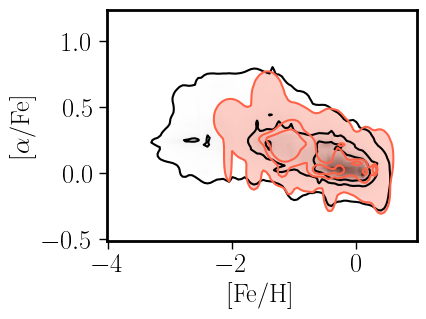

In [ ]:
hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'

hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'
n_fib = 519

#tab_now = tab_coeffs[tab_coeffs['id_fib']==n_fib]
#print(hdu_now.data.shape)

#print(len(tab_now))


fig, ax = plt.subplots(figsize=(4,3))  
out = PDF_plot(ax=ax,hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=[0.85,0.40,0.0])  
#print(nx,ny)

0.15 0.15
0.15 0.45
0.45 0.15


0.45 0.45


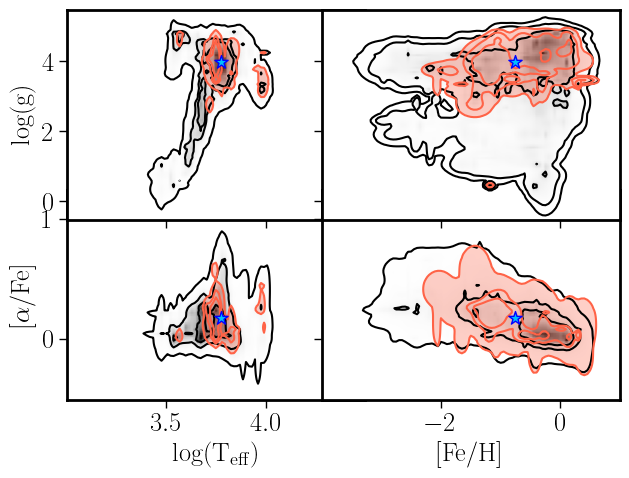

In [ ]:

# n_fib=49
# n_fib=1808
#n_fib=224
#n_fib=1808





fig=plt.figure(figsize=(8.5,6))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]



hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100

mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


#axLS[0].scatter(tab_in['TEFF'],tab_in['ALPHAM'],color='green',s=5)

#axLS[1].scatter(tab_in['TEFF'],tab_in['LOGG'],color='green')
#print(tab_in['TEFF'][n_fib],tab_in['LOGG'][n_fib])
#figname=f'PDF_rsp_Helix_{n_fib}'
#fig.tight_layout()
#fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")

In [ ]:
tab_coeffs[(tab_coeffs['id_fib'] == n_fib) & (tab_coeffs['COEFF'] > 0)]

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str9,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
4297.519,3.9923,3.3635,-1.3772,0.35,0.0118,0.0117,11.8486,0.1,0.0118,0.001,11,519
4297.519,3.8228,4.0041,-0.3572,0.0797,0.0284,0.0269,13.1735,0.1,0.0284,0.0056,13,519
4297.519,3.5949,3.9019,-0.2772,0.0364,0.0017,0.0016,14.1546,0.1,0.0017,0.0003,37,519
4297.519,3.8301,3.9344,0.0449,0.0469,0.1285,0.1291,13.1471,0.1,0.1285,0.0069,39,519
4297.519,3.5757,4.6613,-0.1899,0.0886,0.0077,0.0077,14.224,0.1,0.0077,0.0006,41,519
4297.519,3.7086,4.1673,-0.0845,0.0906,0.0155,0.0153,13.9923,0.1,0.0155,0.0016,50,519
4297.519,3.742,4.2724,0.0945,0.1507,0.0269,0.0268,13.5076,0.1,0.0269,0.0021,52,519
4297.519,3.9896,3.4372,-1.0824,0.1473,0.0297,0.0295,12.5171,0.1,0.0297,0.0023,59,519
4297.519,3.659,2.0331,-0.3388,0.1252,0.0003,0.0003,13.2975,0.1,0.0003,0.0001,62,519


In [ ]:
mask_id = tab_DAP_st['fiberid'] == n_fib
tab_DAP_st['Teff','Log_g','Fe','alpha'][mask_id]

Teff,Log_g,Fe,alpha
float64,float64,float64,float64
5992.060622003844,3.9799085201300977,-0.7663389556070829,0.17344986268878576


In [ ]:
np.log10(tab_DAP_st['Teff'][mask_id])

3.777576198494576


In [ ]:
tab_coeffs[(tab_coeffs['id_fib'] == n_fib)]

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str9,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
4297.519,3.8065,4.0113,-2.0998,0.3273,0.0,0.0,14.6447,0.1,0.0,0.0,0,519
4297.519,3.7847,3.7481,-1.3644,0.3267,0.0,0.0,14.4138,0.1,0.0,0.0,1,519
4297.519,3.6626,1.7684,-1.3138,0.2218,0.0,0.0,13.753,0.1,0.0,0.0,2,519
4297.519,3.7833,4.2391,-0.2624,0.0914,0.0,0.0,13.4045,0.1,0.0,0.0,3,519
4297.519,3.6829,3.8664,0.02,0.0379,0.0,0.0,13.4159,0.1,0.0,0.0,4,519
4297.519,3.6615,4.5936,-0.0338,0.0238,0.0,0.0,13.9712,0.1,0.0,0.0,5,519
4297.519,3.7571,3.7104,-0.7526,0.1597,0.0,0.0,13.9862,0.1,0.0,0.0,6,519
4297.519,3.6112,1.292,-0.8048,0.1121,0.0,0.0,13.207,0.1,0.0,0.0,7,519
4297.519,3.7213,2.9467,-1.6334,0.2709,0.0,0.0,13.9755,0.1,0.0,0.0,8,519


In [ ]:
from astropy.table import Table, vstack

# Group by 'rsp' and calculate the mean for each group
grouped_data = {}
for col in tab_coeffs.colnames:
    if col in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
        grouped_data[col] = []
    else:
        grouped_data[col] = []

unique_rsp = set(tab_coeffs['rsp'])
for rsp_value in unique_rsp:
    mask = tab_coeffs['rsp'] == rsp_value
    grouped_data['rsp'].append(rsp_value)
    for col in tab_coeffs.colnames:
        if col not in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
            grouped_data[col].append(tab_coeffs[col][mask].mean())
        elif col == 'id':  # For 'id', concatenate unique values as strings
            grouped_data[col].append(','.join(tab_coeffs[col][mask]))

# Create a new table with the averaged data
output_table = Table(grouped_data)
output_table['id'] = 1
output_table['id_fib'] = 1


In [ ]:
output_table

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str37,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64
1,3.8065,4.0113,-2.0998,0.3273,0.0,0.0,14.6447,0.135,0.0,0.0,0,1.0
1,3.7847,3.7481,-1.3644,0.3267,0.0,0.0,14.4138,0.135,0.0,0.0,1,1.0
1,3.6626,1.7684,-1.3138,0.2218,0.0,0.0,13.753,0.135,0.0,0.0,2,1.0
1,3.7833,4.2391,-0.2624,0.0914,0.0,0.0,13.4045,0.135,0.0,0.0,3,1.0
1,3.6829,3.8664,0.02,0.0379,0.0,0.0,13.4159,0.135,0.0,0.0,4,1.0
1,3.6615,4.5936,-0.0338,0.0238,0.0,0.0,13.9712,0.135,0.0,0.0,5,1.0
1,3.7571,3.7104,-0.7526,0.1597,0.0,0.0,13.9862,0.135,0.0,0.0,6,1.0
1,3.6112,1.292,-0.8048,0.1121,0.0,0.0,13.207,0.135,0.0,0.0,7,1.0
1,3.7213,2.9467,-1.6334,0.2709,0.0,0.0,13.9755,0.135,0.0,0.0,8,1.0


In [ ]:
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

0.15 0.15
0.15 0.45
0.45 0.15
0.45 0.45


/tmp/ipykernel_81226/4290924078.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


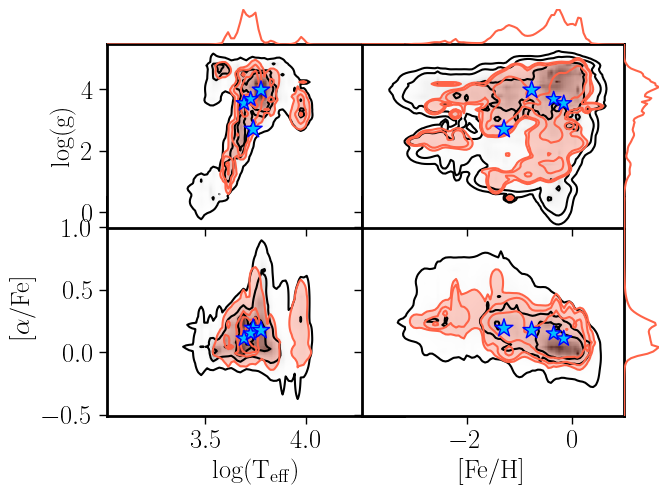

In [ ]:

# n_fib=49
# n_fib=1808
n_fib=1
#n_fib=1808





fig=plt.figure(figsize=(8.5,6.25))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]





hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
den_map,den_map_few = PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts, pXhist=True)  


hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pYhist=True)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pXhist=True,pYhist=True)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100
size = (tab_DAP_st['SN_st'])*5
mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'],tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


#axLS[0].scatter(tab_in['TEFF'],tab_in['ALPHAM'],color='green',s=5)

#axLS[1].scatter(tab_in['TEFF'],tab_in['LOGG'],color='green')
#print(tab_in['TEFF'][n_fib],tab_in['LOGG'][n_fib])
figname=f'PDF_rsp_Helix_SN25'
fig.tight_layout()
fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")